## Purpose of the notebook: Reproduce the paper figures and instructions for applying the code to custom data.

### 0.1 Imports 

In [1]:
import numpy as np
import pandas as pd
import os
import json
import shutil

import cv2
import PIL
from PIL import Image, ImageOps
from scipy.ndimage import binary_dilation, label, gaussian_filter
from IPython.display import display

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import LogNorm

### 0.2 Helper functions

In [2]:
def horzpil(images, width, height, margin=2):
    """Concatenate images horizontally with a small margin between them."""
    images = [PIL.Image.open(image_path) for image_path in images]
    
    total_width = width * len(images) + margin * (len(images) - 1)
    max_height = height
    new_im = PIL.Image.new('RGB', (total_width, max_height), color=(255, 255, 255))
    
    x_offset = 0
    for img in images:
        new_im.paste(img, (x_offset, 0))
        x_offset += width + margin
    return new_im

def folder_to_grid(folder_paths, folder_order, character_index, image_width, image_height, margin=2):
    """Convert images in multiple folders to a horizontal grid based on the specified order."""
    grid_images = []
    
    for folder_name in folder_order:
        folder_path = os.path.join(folder_paths, folder_name)
        print(f"Processing folder: {folder_path}")  
        folder_images = []
        
        # Iterate through image names in specified order for each folder
        for i in character_index:
            image_path = os.path.join(folder_path, f"{i}.png")
            if os.path.exists(image_path):
                folder_images.append(image_path)
                #print(f"Taking image from {folder_name}: {i}.png")
                
        # Check if folder_images is not empty
        if folder_images:
            # Concatenate images horizontally for the current folder with a margin
            folder_grid = horzpil(folder_images, image_width, image_height, margin=margin)
            grid_images.append(folder_grid)
    
    # Concatenate grid images vertically to form the final grid if there are images
    if grid_images:
        final_grid = PIL.Image.new('RGB', (grid_images[0].width, sum(grid_img.height for grid_img in grid_images)), color=(255, 255, 255))
        y_offset = 0
        for grid_img in grid_images:
            final_grid.paste(grid_img, (0, y_offset))
            y_offset += grid_img.height
    else:
        final_grid = PIL.Image.new('RGB', (1, 1), color=(255, 255, 255))  # Create a blank white image
    
    display(final_grid)
    return final_grid

In [3]:
# Custom colormap
cmap = LinearSegmentedColormap.from_list('custom_cmap', ['blue', 'white', 'red'], N=256)

def subtract_images(image1, image2, axes, opacity=0.5):
    result = image1.astype(float) - image2.astype(float)

    # Display the result on the third subplot
    axes[2].imshow(result, cmap=cmap, vmin=-255, vmax=255, alpha=opacity)
    axes[2].axis('off') 
    
    return result

def visualize_comparison(folder1, folder2, character_order, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    
    for character in character_order:
        image1_path = os.path.join(folder1, f"{character}.png")
        image2_path = os.path.join(folder2, f"{character}.png")

        if not os.path.exists(image1_path):
            print(f"Image 1 not found: {image1_path}")
            continue
        if not os.path.exists(image2_path):
            print(f"Image 2 not found: {image2_path}")
            continue

        image1 = np.array(Image.open(image1_path).convert('L'))
        image2 = np.array(Image.open(image2_path).convert('L'))

        fig, axes = plt.subplots(1, 3, figsize=(18, 4))
        
        axes[0].imshow(image1, cmap='gray', vmin=0, vmax=255)
        axes[0].axis('off')

        axes[1].imshow(image2, cmap='gray', vmin=0, vmax=255)
        axes[1].axis('off')

        result = subtract_images(image1, image2, axes, opacity=0.5)
        result_path = os.path.join(output_folder, f"{character}.png")
        plt.imsave(result_path, result, cmap=cmap, vmin=-255, vmax=255)

        visual_comparison_path = os.path.join(output_folder, f"visual_comparison_character_{character}.png")
        plt.savefig(visual_comparison_path)
        
        plt.tight_layout()
        plt.show()

In [4]:
def calculate_l2_norm(image1, image2):
    array1 = np.array(image1).astype(float) / 255.0 
    array2 = np.array(image2).astype(float) / 255.0 
    difference = array1 - array2
    l2_norm = np.sqrt(np.sum(difference**2))
    return l2_norm

In [5]:
#Calculate variance 

# Create a mapping dictionary to map the documents to their class and reference code in the article
codename_to_id = {
    'NT1': 'btv1b8447298r',
    'NT2': 'btv1b525068331',
    'NT3': 'Arras-861',
    'NT4': 'btv1b84473026',
    'NT5': 'btv1b8455783p',
    'NT6': 'btv1b55006072j',
    'NT7': 'SBB-PK-Hdschr25',
    'ST1': 'btv1b90615126',
    'ST2': 'btv1b100361755',
    'ST3': 'btv1b8433319z',
    'ST4': 'IB15304245v',
    'ST5': 'btv1b90590259',
    'ST6': 'btv1b8446940n',
    'ST7': 'IB15304274v'
}

# Flatten image into a vector
def flatten_image(image):
    return image.flatten() / 255.0  # Normalize pixel values to [0, 1]

# Calculate standard deviation of pixel values for a directory that contains all the document prototypes of a class
def calculate_metric_for_directory(directory_path, class_prefix):
    if not os.path.isdir(directory_path):
        print("Error: Directory does not exist.")
        return

    image_names = []
    stds = []

    for image_name in list(range(28, 37)) + list(range(39, 49)): 

        images = []

        for codename, doc_id in codename_to_id.items():
            if codename.startswith(class_prefix):
                subfolder_path = os.path.join(directory_path, doc_id)

                if os.path.isdir(subfolder_path):
                    image_path = os.path.join(subfolder_path, f"{image_name}.png")

                    if os.path.isfile(image_path):
                        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                        flattened_image = flatten_image(image)

                        images.append(flattened_image)

        images = np.array(images)

        variance = np.var(images, axis=0, ddof=1)
        
        # Calculate metric (standard deviation)
        std = np.sqrt(np.sum(variance))

        image_names.append(f"Image {image_name}.png")
        stds.append(std)

    df = pd.DataFrame({'Image': image_names, 'Std': stds})

    return df

def merge_dataframes(st_df, nt_df):
    # Merge the DataFrames on the 'Image' column
    merged_df = pd.merge(st_df, nt_df, on='Image', suffixes=('_ST', '_NT'))
    return merged_df

### 1.0  From the finetuned output, choose only the range of characters that we want to include in our analysis

In [6]:
#Adjust as per preference if used on custom dataset
folder_order = ['baseline', "Northern_Textualis", "btv1b8447298r", "btv1b525068331", "Arras-861", "btv1b84473026",
                "btv1b8455783p", "btv1b55006072j", "SBB-PK-Hdschr25", 'Southern_Textualis', "btv1b90615126", "btv1b100361755", "btv1b8433319z",
               "IB15304245v", "btv1b90590259", "btv1b8446940n", "IB15304274v"]

in_path = 'runs/iwcp_south_north/finetune'
out_path  = 'paper_results/prototypes/finetuned/'

ignore_files = {'grid-1l.png', 'grid.png', 'model.pth', 'config.yaml', 'transcribe.json'}

character_range = list(range(28, 37)) + list(range(39, 49)) #this range corresponds to the characters from a-u excluding j/k

def select_images(in_path, out_path):
    for file in os.listdir(in_path):
        if file.endswith('.png') and file not in ignore_files:
            try:
                file_index = int(file.split('.')[0])
            except ValueError:
                continue
            if file_index in character_range:
                shutil.copy2(os.path.join(in_path, file), out_path)

def process_directory(source_directory):
    for folder in os.listdir(source_directory):
        folder_path = os.path.join(source_directory, folder)
        
        if os.path.isdir(folder_path):
            new_folder_path = os.path.join(out_path, folder)
            os.makedirs(new_folder_path, exist_ok=True)

            sprites_final_path = os.path.join(folder_path, 'sprites', 'final')
            
            if os.path.exists(sprites_final_path):
                select_images(sprites_final_path, new_folder_path)

            # Handle the baseline folder case
            baseline_path = os.path.join(folder_path, 'baseline')
            if os.path.exists(baseline_path):
                select_images(baseline_path, new_folder_path)

            if not os.path.exists(sprites_final_path):
                select_images(folder_path, new_folder_path)

process_directory(in_path)

### 1.1 Visualise the finetuned prototypes

Created directory: paper_results/grids/
Processing folder: paper_results/prototypes/finetuned/baseline
Processing folder: paper_results/prototypes/finetuned/Northern_Textualis
Processing folder: paper_results/prototypes/finetuned/btv1b8447298r
Processing folder: paper_results/prototypes/finetuned/btv1b525068331
Processing folder: paper_results/prototypes/finetuned/Arras-861
Processing folder: paper_results/prototypes/finetuned/btv1b84473026
Processing folder: paper_results/prototypes/finetuned/btv1b8455783p
Processing folder: paper_results/prototypes/finetuned/btv1b55006072j
Processing folder: paper_results/prototypes/finetuned/SBB-PK-Hdschr25
Processing folder: paper_results/prototypes/finetuned/Southern_Textualis
Processing folder: paper_results/prototypes/finetuned/btv1b90615126
Processing folder: paper_results/prototypes/finetuned/btv1b100361755
Processing folder: paper_results/prototypes/finetuned/btv1b8433319z
Processing folder: paper_results/prototypes/finetuned/IB15304245v
Proc

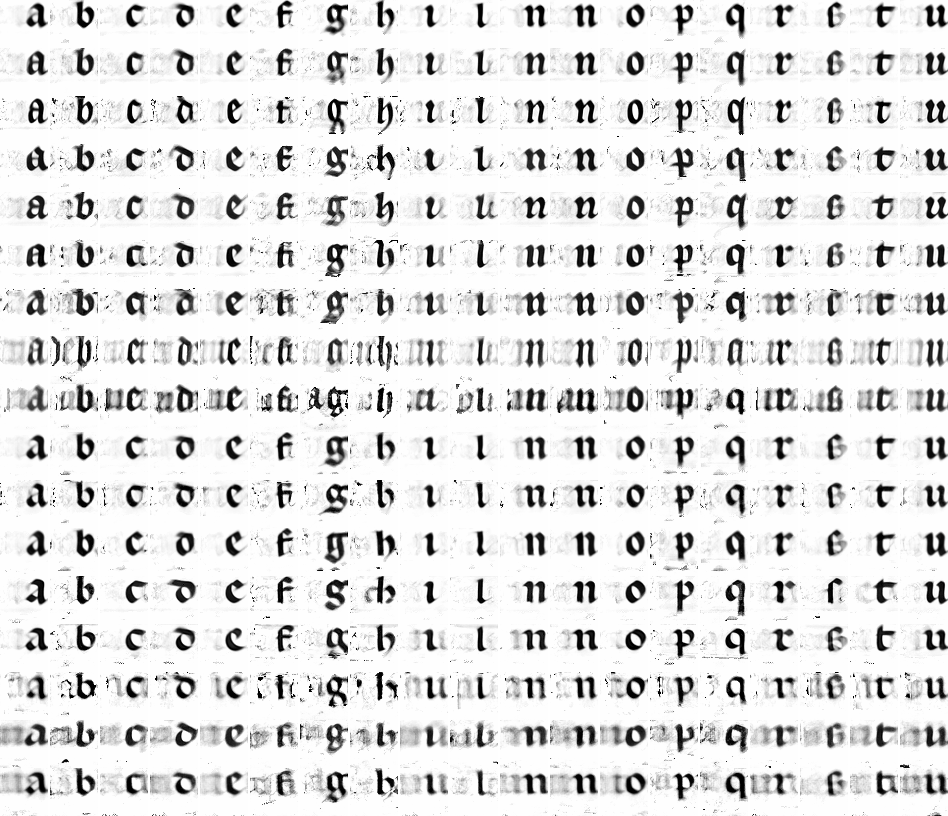

Image saved at: paper_results/grids/finetuned_prototypes.jpeg


In [7]:
denoised_prototype_folders = "paper_results/prototypes/finetuned/"
output_folder = "paper_results/grids/"
output_path = os.path.join(output_folder, "finetuned_prototypes.jpeg")

os.makedirs(output_folder, exist_ok=True)
print(f"Created directory: {output_folder}")

sample_image_path = os.path.join(denoised_prototype_folders, folder_order[0], f"{character_range[0]}.png")
sample_image = PIL.Image.open(sample_image_path)

image_width, image_height = sample_image.size

margin = 2

denoised_prototypes_borders = folder_to_grid(denoised_prototype_folders, folder_order, character_range, image_width, image_height, margin=margin)

denoised_prototypes_borders.save(output_path)
print("Image saved at:", output_path)

### 1.2 Filtering out the prototypes from artefacts (cf. Section 3.1 in the paper). 

In [8]:
finetuned_path = "paper_results/prototypes/finetuned/"
filtered_path = "paper_results/prototypes/filtered/"
reference_folder = "paper_results/prototypes/finetuned/baseline/"

for folder in os.listdir(finetuned_path):
    if folder == '.DS_Store':
        continue 
    
    input_folder = os.path.join(finetuned_path, folder)
    output_folder = os.path.join(filtered_path, folder)
    
    if os.path.exists(output_folder):
        print(f"Skipping processing for folder '{folder}' as it already exists in the output directory.")
        continue
    
    os.makedirs(output_folder)
    
    images = []
    masks_ref = []
    
    for file in os.listdir(input_folder):
        if file.endswith('.png'):
            image_path = os.path.join(input_folder, file)
            image = Image.open(image_path).convert("L")
            images.append(image)
            
            # Load reference mask from the baseline folder
            mask_path = os.path.join(reference_folder, file)
            mask = Image.open(mask_path).convert("L")
            
            # Process the mask
            mask_array = np.array(mask)
            threshold_value = 0.65 * 255
            binary_mask = np.where(mask_array < threshold_value, 255, 0).astype(np.uint8)
            dilated_mask = binary_dilation(binary_mask)
            dilated_mask = binary_dilation(dilated_mask)
            labeled_mask, num_features = label(dilated_mask)
            component_sizes = [np.sum(labeled_mask == label_idx) for label_idx in range(1, num_features + 1)]
            largest_component_label = np.argmax(component_sizes) + 1
            largest_component_mask = np.where(labeled_mask == largest_component_label, 255, 0).astype(np.uint8)
            convolved_mask = gaussian_filter(largest_component_mask, sigma=1)
            masks_ref.append(convolved_mask)
    
    # Apply masks to images and save filtered images
    for image, mask, file in zip(images, masks_ref, os.listdir(input_folder)):
        img_array = np.array(image)
        filtered_image = 255 - mask + img_array * (mask / 255)
        filtered_image = Image.fromarray(filtered_image.astype(np.uint8))
        
        filename = file
        filtered_image_path = os.path.join(output_folder, filename)
        filtered_image.save(filtered_image_path)
        
print("Processing complete.")

Processing complete.


### 1.3 Perform automatic failure case identification for our filtered sprites (cf. Section 3.1 of the article). 

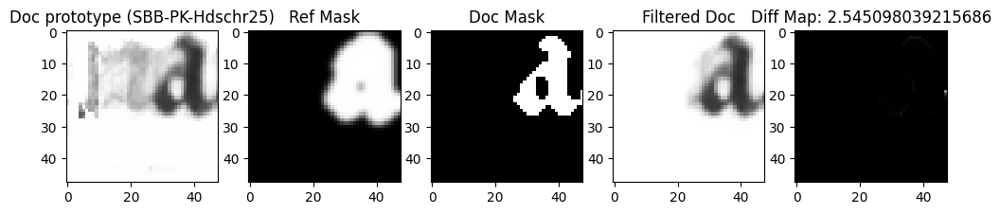

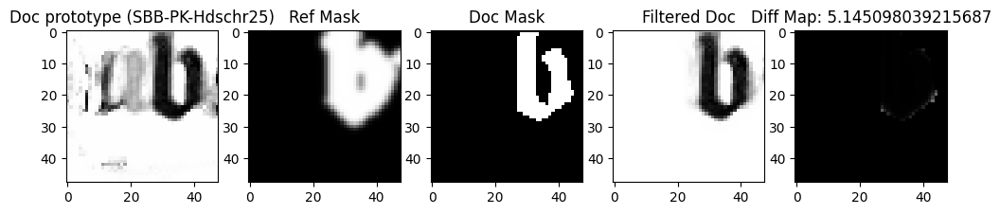

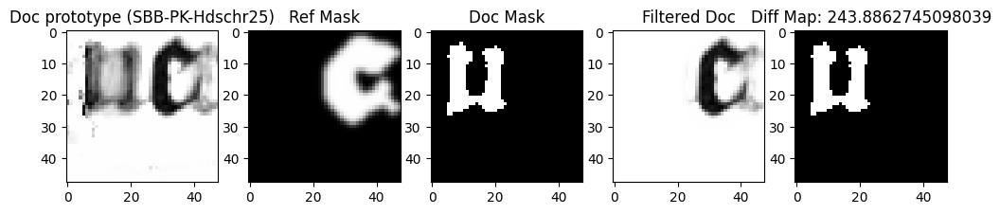

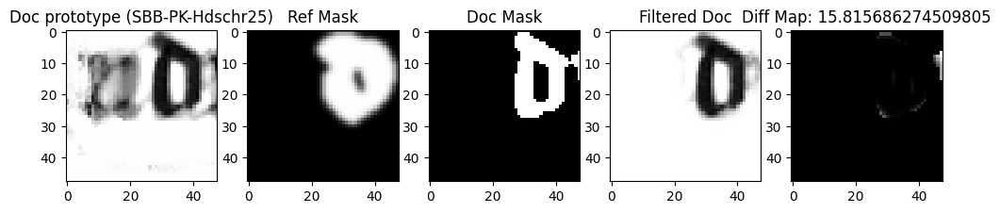

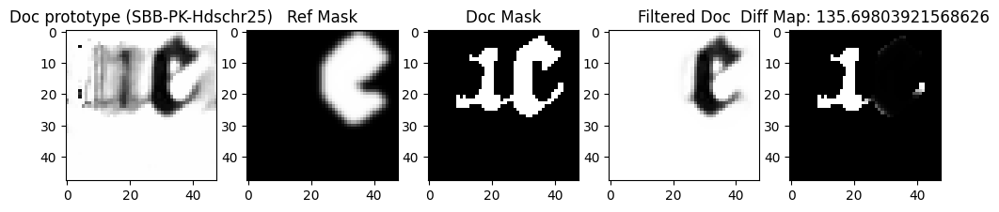

...

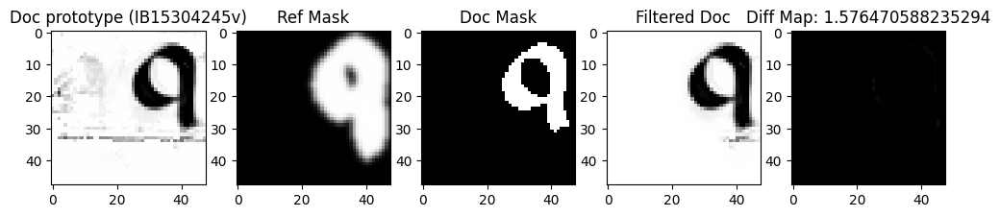

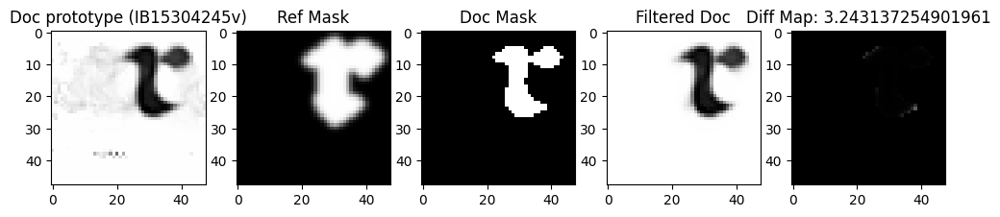

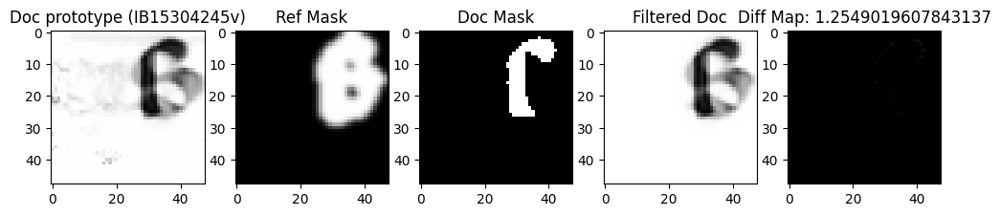

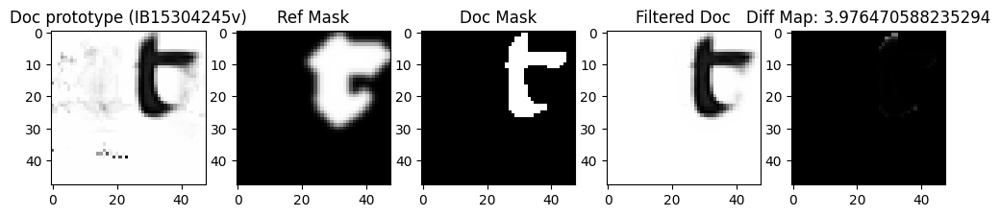

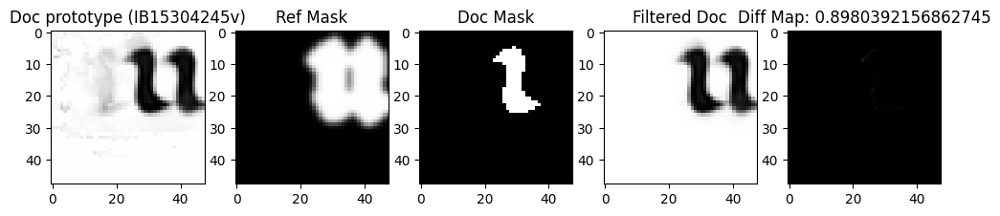

In [9]:
input_parent_folder = "paper_results/prototypes/finetuned/"
output_parent_folder = "paper_results/prototypes/filtered_failure_cases/"
baseline_folder = "paper_results/prototypes/finetuned/baseline/"

# Threshold values
default_threshold = 0.8 * 255  # Default threshold for reference mask
sup_threshold = 0.65 * 255  # threshold for doc mask

for folder in os.listdir(input_parent_folder):
    if folder == '.DS_Store':
        continue 
    
    input_folder = os.path.join(input_parent_folder, folder)
    output_folder = os.path.join(output_parent_folder, folder)
    
    os.makedirs(output_folder, exist_ok=True)
    
    images = []
    masks_ref = []
    masks_sup = []
    deviations_per_image = []
    
    for file in sorted(os.listdir(input_folder)):
        if file.endswith('.png'):
            image_path = os.path.join(input_folder, file)
            image = Image.open(image_path).convert("L") 
            images.append(image)
            
            # Load reference mask from the baseline folder
            mask_path = os.path.join(baseline_folder, file)
            mask = Image.open(mask_path).convert("L")
            
            # Process the reference mask
            mask_array = np.array(mask)
            binary_mask_ref = np.where(mask_array < default_threshold, 255, 0).astype(np.uint8)
            dilated_mask_ref = binary_mask_ref
            for _ in range(2):  # Dilate x times
                dilated_mask_ref = binary_dilation(dilated_mask_ref)
            labeled_mask_ref, num_features_ref = label(dilated_mask_ref)
            component_sizes_ref = [np.sum(labeled_mask_ref == label_idx) for label_idx in range(1, num_features_ref + 1)]
            largest_component_label_ref = np.argmax(component_sizes_ref) + 1
            largest_component_mask_ref = np.where(labeled_mask_ref == largest_component_label_ref, 255, 0).astype(np.uint8)
            convolved_mask_ref = gaussian_filter(largest_component_mask_ref, sigma=1)
            masks_ref.append(convolved_mask_ref)
            
            # Process the doc mask
            img_array = np.array(image)
            binary_mask_sup = np.where(img_array < sup_threshold, 255, 0).astype(np.uint8)
            labeled_mask_sup, num_features_sup = label(binary_mask_sup)
            component_sizes_sup = [np.sum(labeled_mask_sup == label_idx) for label_idx in range(1, num_features_sup + 1)]
            largest_component_label_sup = np.argmax(component_sizes_sup) + 1
            largest_component_mask_sup = np.where(labeled_mask_sup == largest_component_label_sup, 255, 0).astype(np.uint8)
            masks_sup.append(largest_component_mask_sup)
            
            # Apply masks to the reference image
            filtered_image_ref = 255 - masks_ref[-1] + img_array * (masks_ref[-1] / 255)
            filtered_image_ref = np.clip(filtered_image_ref, 0, 255).astype(np.uint8)
            filtered_image_ref = Image.fromarray(filtered_image_ref).convert('RGB')
            
            # Save the filtered doc image 
            filtered_image_path = os.path.join(output_folder, file)
            filtered_image_ref.save(filtered_image_path)
            
            difference = (np.sum(masks_sup[-1] * (255. - masks_ref[-1])) / 255.) / 255
            
            # Set/adjust border colors based on difference score thresholds
            if 15.5 <= difference <= 30:
                border_color = 'orange'  
            elif difference > 30:
                border_color = 'red'  
            else:
                border_color = 'white'  
            
            filtered_image_ref_with_border = ImageOps.expand(filtered_image_ref, border=2, fill=border_color)
            
            filtered_image_path_with_border = os.path.join(output_folder, file)
            filtered_image_ref_with_border.save(filtered_image_path_with_border)
            
            difference_array = (masks_sup[-1] * (255. - masks_ref[-1])) / 255.
            difference_image = Image.fromarray(difference_array.astype(np.uint8))
            deviations_per_image.append(difference)

            fig, axes = plt.subplots(1, 5, figsize=(12, 4))
            
            axes[0].imshow(img_array, cmap='gray', clim=(0, 255))
            axes[0].set_title(f'Doc prototype ({folder})')
            axes[1].imshow(convolved_mask_ref, cmap='gray', clim=(0, 255))
            axes[1].set_title('Ref Mask')
            axes[2].imshow(largest_component_mask_sup, cmap='gray', clim=(0, 255))
            axes[2].set_title('Doc Mask')
            axes[3].imshow(filtered_image_ref, cmap='gray', clim=(0, 255))
            axes[3].set_title('Filtered Doc')
            axes[4].imshow(difference_image, cmap='gray', clim=(0, 255))  # Show difference pixels
            axes[4].set_title('Diff Map: '+ str(difference)) 
                        
            plt.show()

### 1.4 Visualise the denoised prototypes with failure identification borders

Created directory: paper_results/grids/
Processing folder: paper_results/prototypes/filtered_failure_cases/baseline
Processing folder: paper_results/prototypes/filtered_failure_cases/Northern_Textualis
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b8447298r
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b525068331
Processing folder: paper_results/prototypes/filtered_failure_cases/Arras-861
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b84473026
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b8455783p
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b55006072j
Processing folder: paper_results/prototypes/filtered_failure_cases/SBB-PK-Hdschr25
Processing folder: paper_results/prototypes/filtered_failure_cases/Southern_Textualis
Processing folder: paper_results/prototypes/filtered_failure_cases/btv1b90615126
Processing folder: paper_results/prototypes/filtered_failure_cas

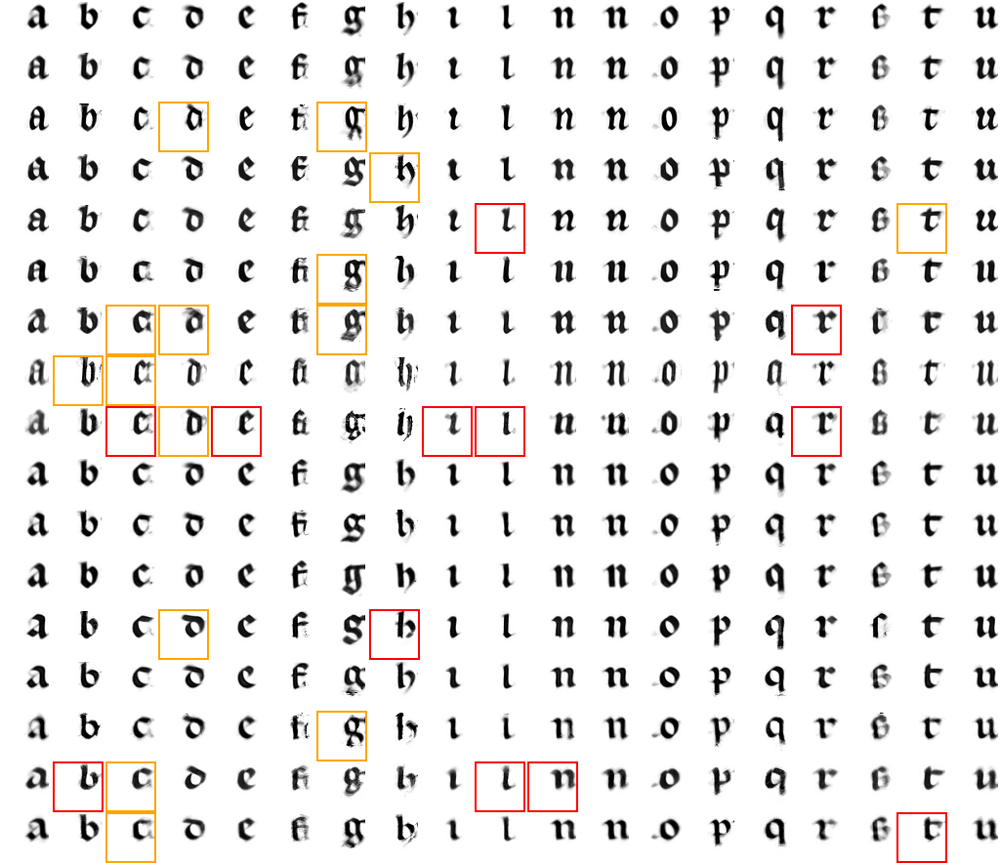

Image saved at: paper_results/grids/prototypes_failure_cases.jpeg


In [10]:
denoised_prototype_folders = "paper_results/prototypes/filtered_failure_cases/"
output_folder = "paper_results/grids/"
output_path = os.path.join(output_folder, "prototypes_failure_cases.jpeg")

os.makedirs(output_folder, exist_ok=True)
print(f"Created directory: {output_folder}")

sample_image_path = os.path.join(denoised_prototype_folders, folder_order[0], f"{character_range[0]}.png")
sample_image = PIL.Image.open(sample_image_path)

image_width, image_height = sample_image.size

margin = 2

denoised_prototypes_borders = folder_to_grid(denoised_prototype_folders, folder_order, character_range, image_width, image_height, margin=margin)

denoised_prototypes_borders.save(output_path)
print("Image saved at:", output_path)

## 2.0 Visual comparison of the prototypes

### 2.1 Compare each document to the baseline and save the results

Processing folder: paper_results/prototypes/filtered/baseline


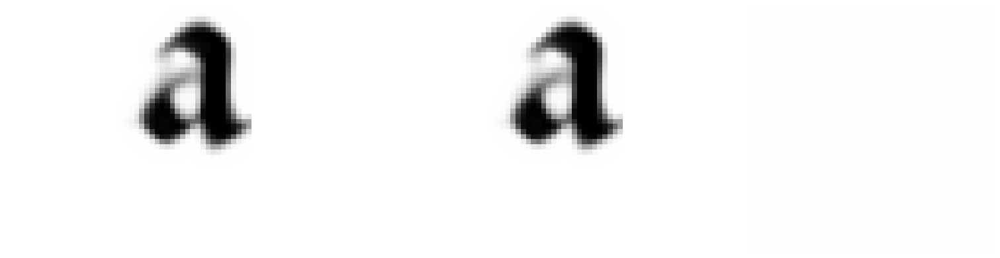

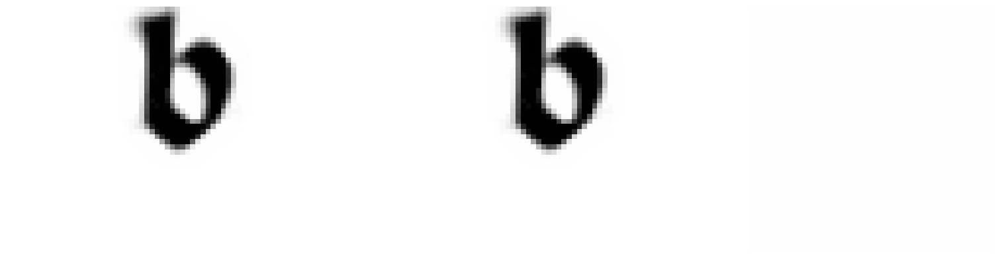

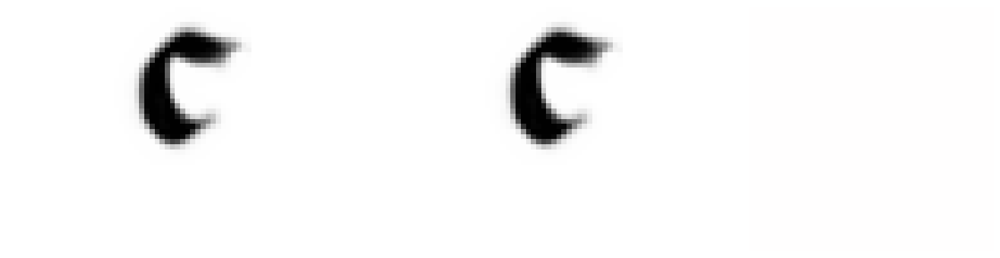

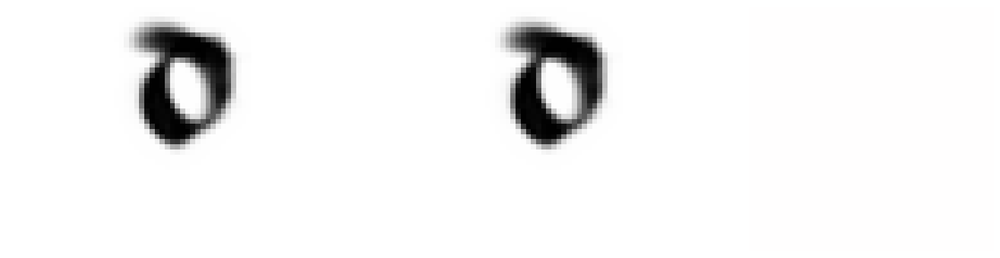

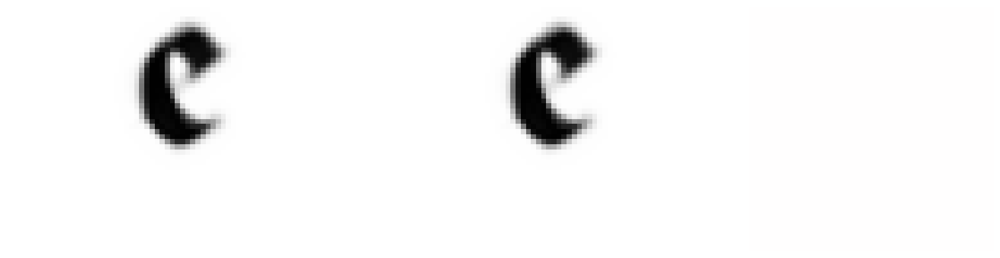

...

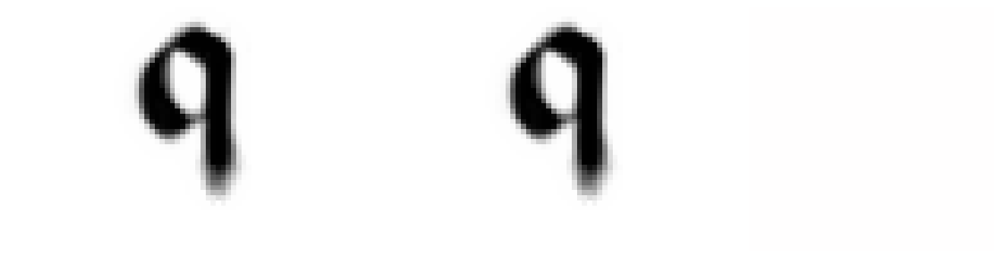

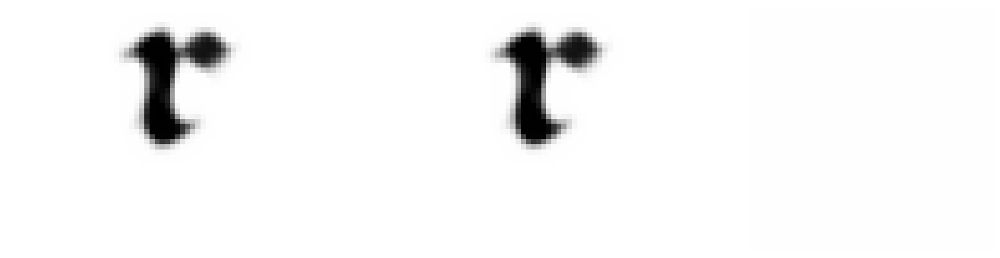

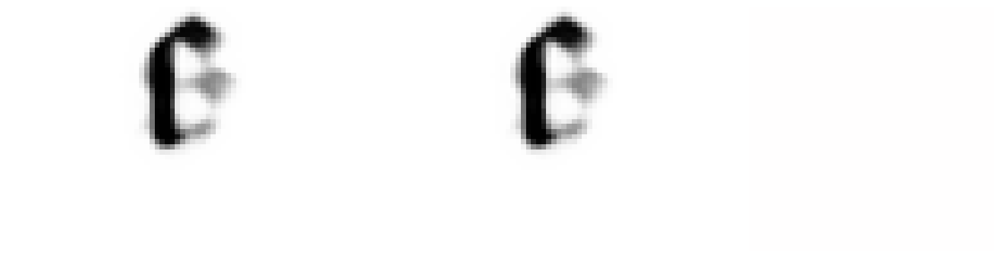

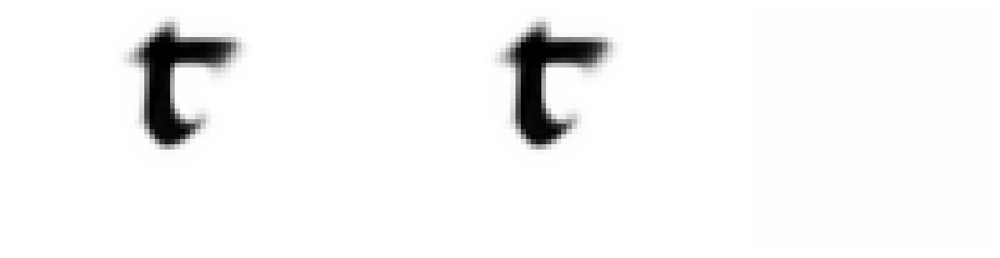

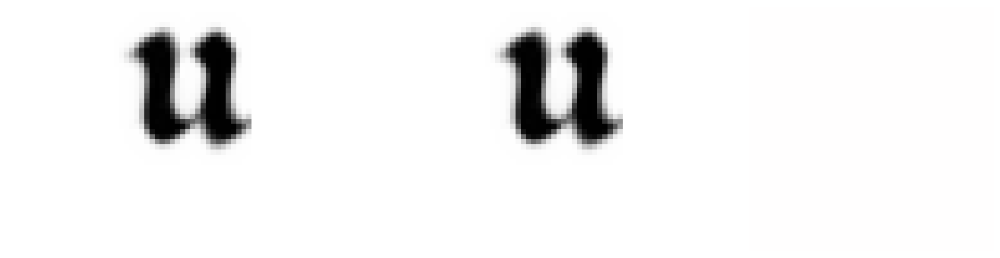

Processing folder: paper_results/prototypes/filtered/Northern_Textualis


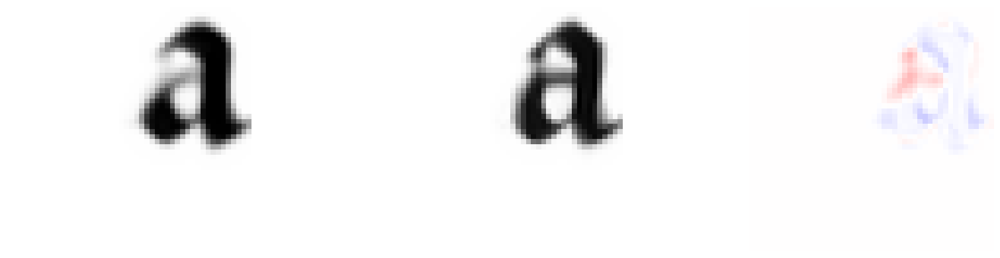

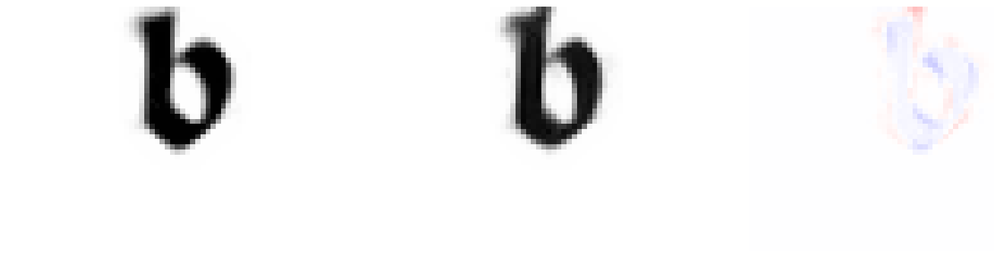

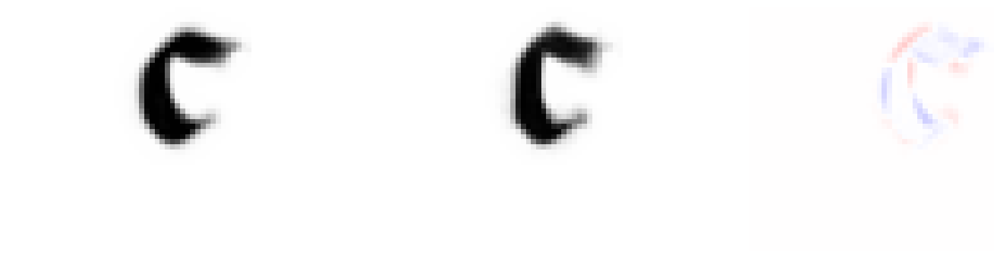

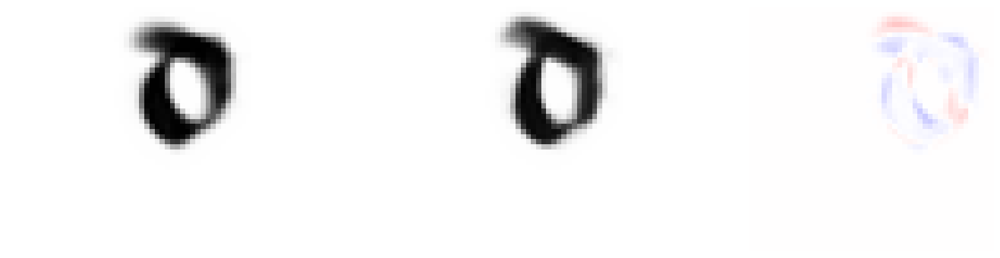

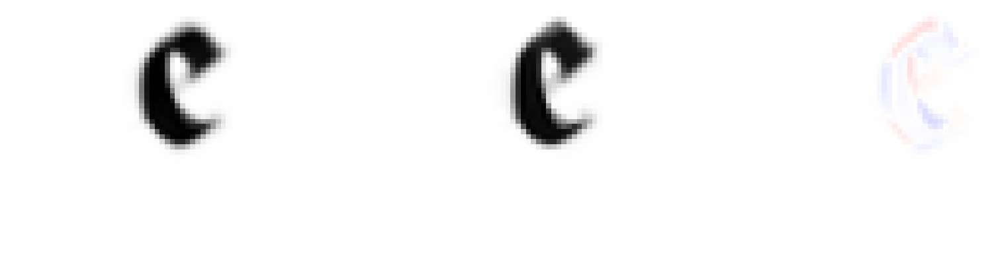

...

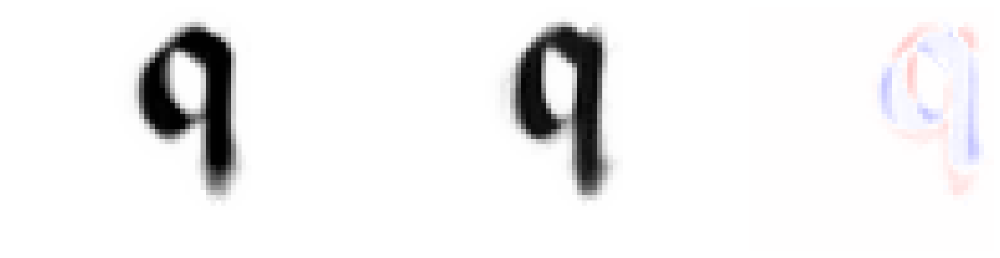

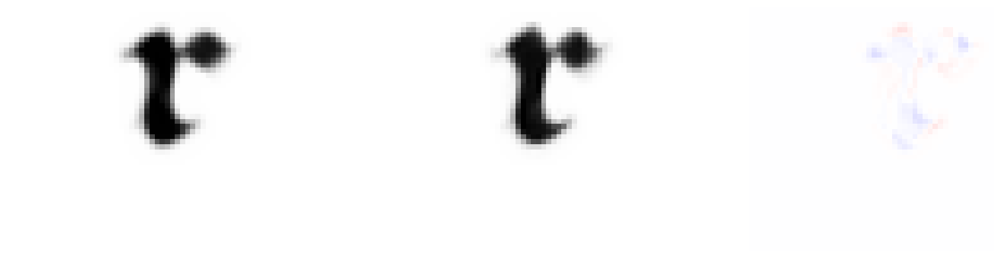

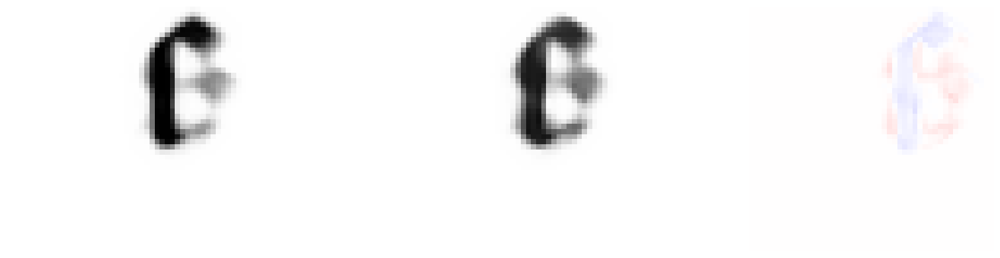

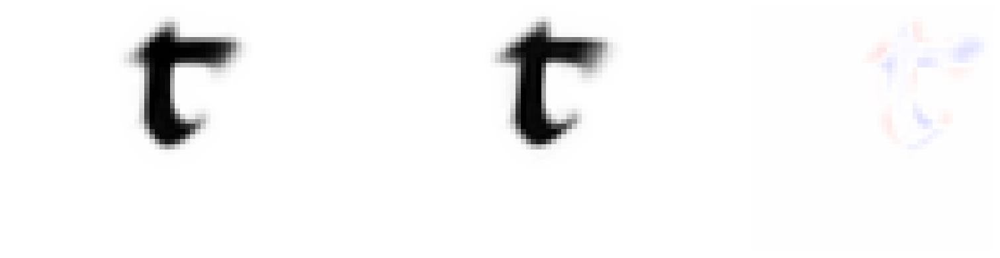

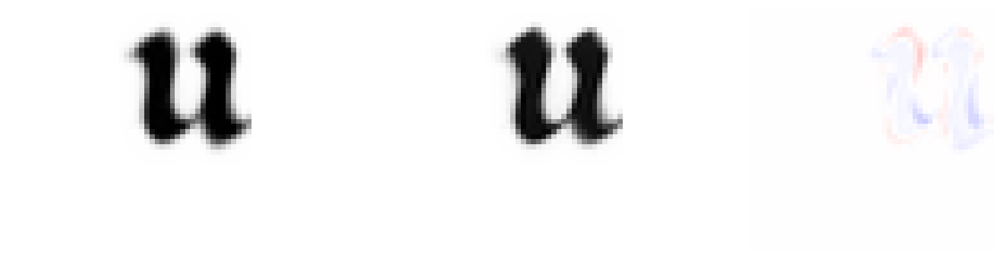

Processing folder: paper_results/prototypes/filtered/btv1b8447298r


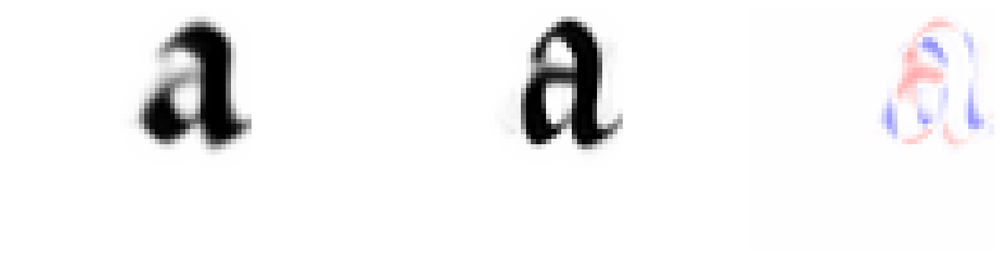

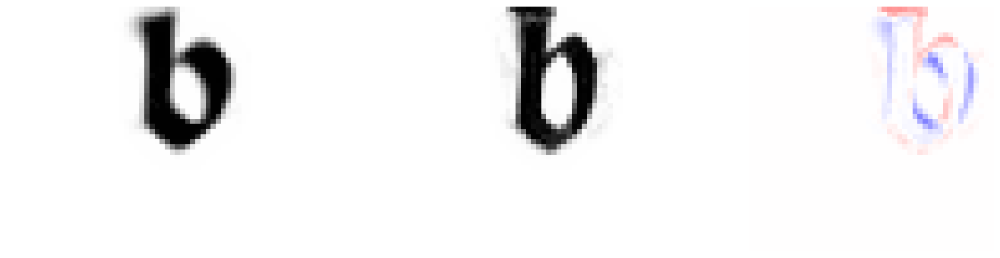

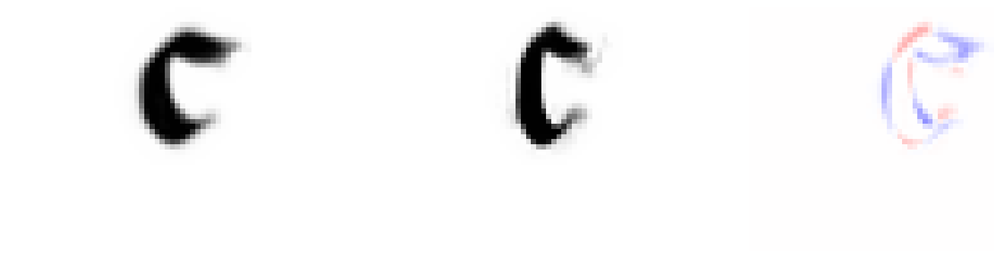

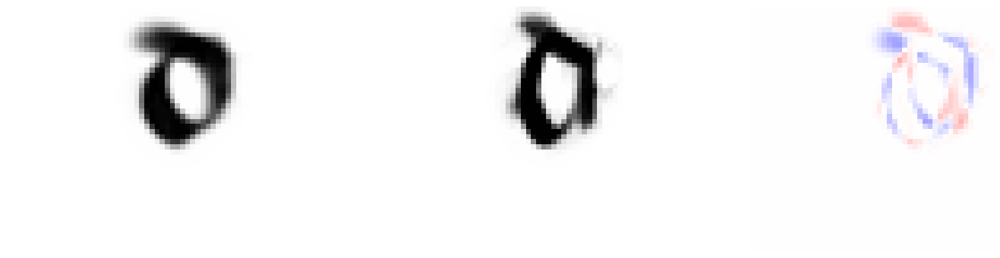

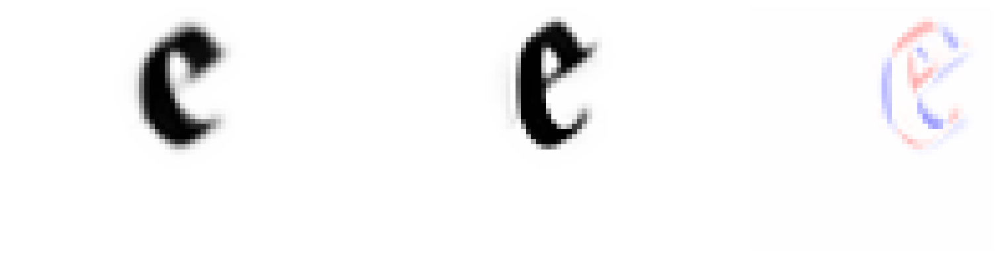

...

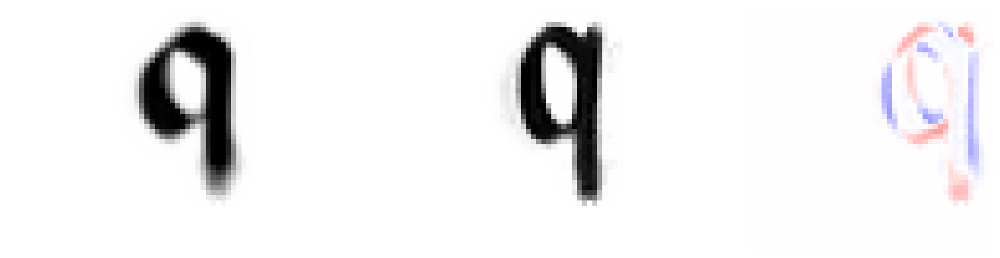

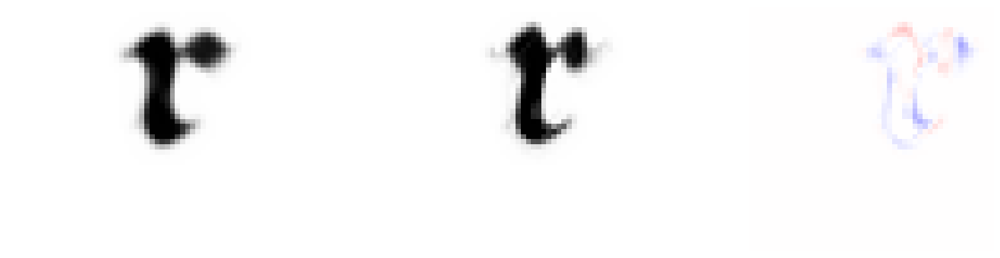

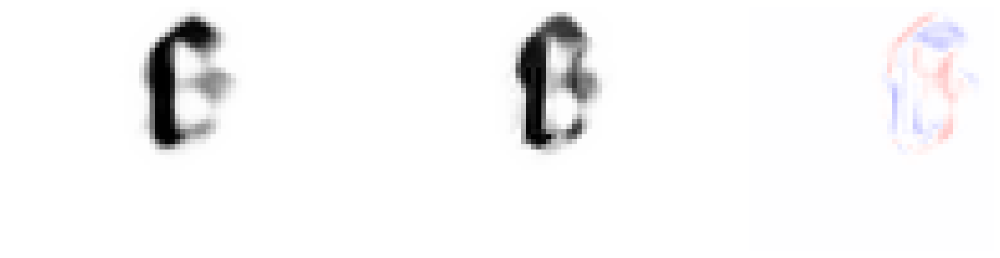

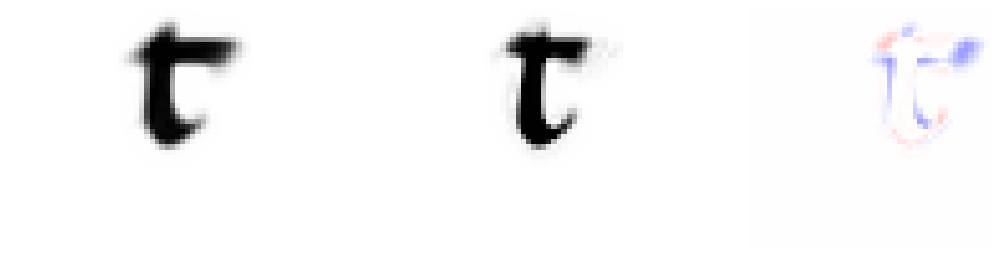

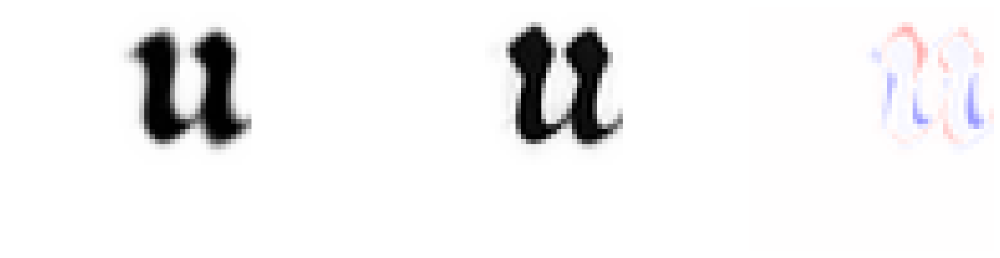

Processing folder: paper_results/prototypes/filtered/btv1b525068331


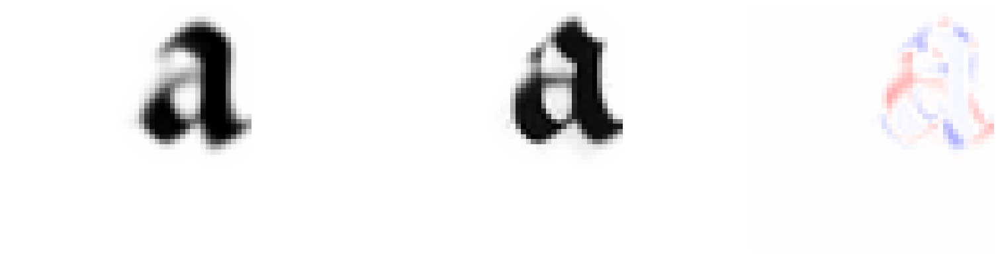

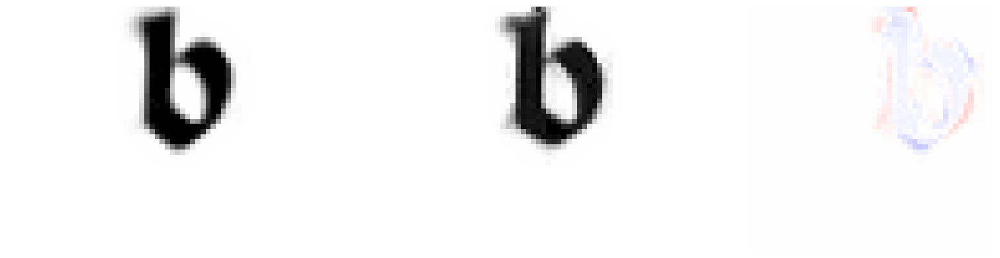

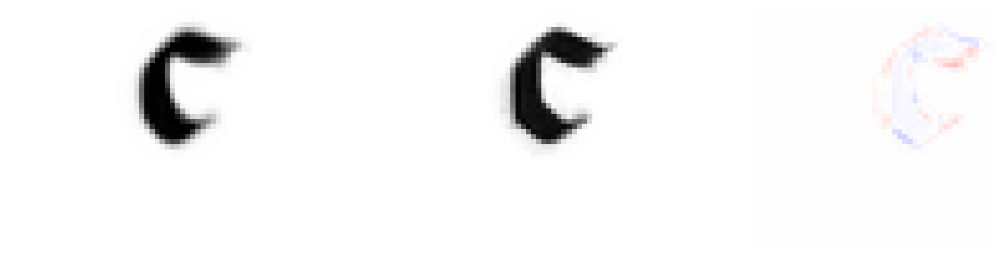

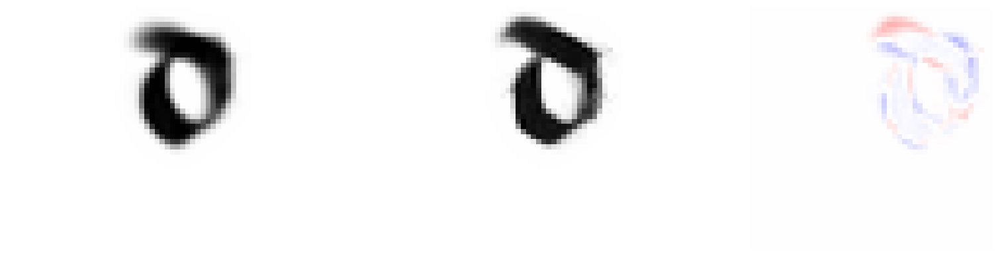

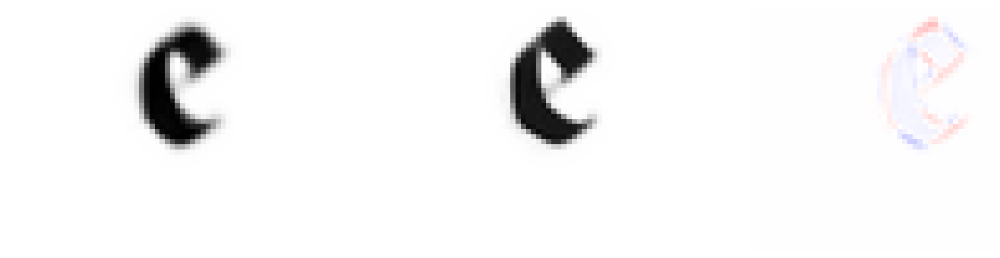

...

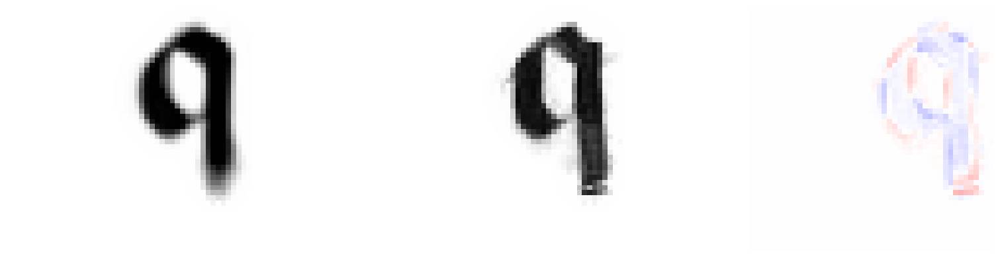

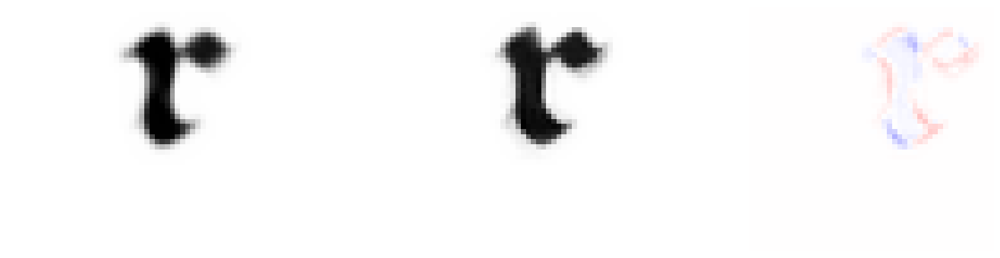

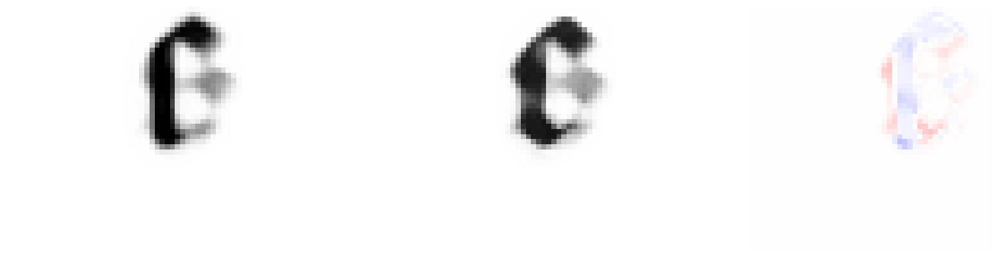

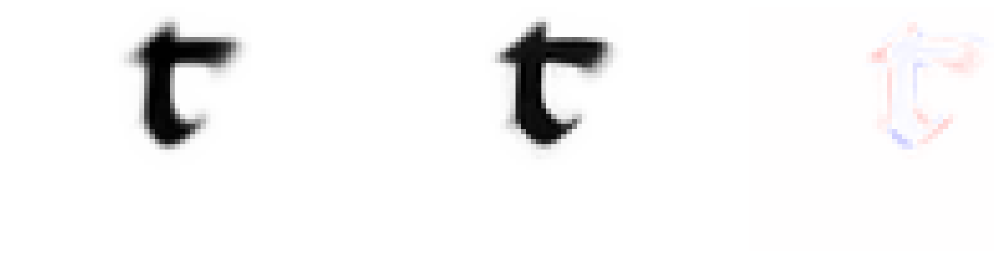

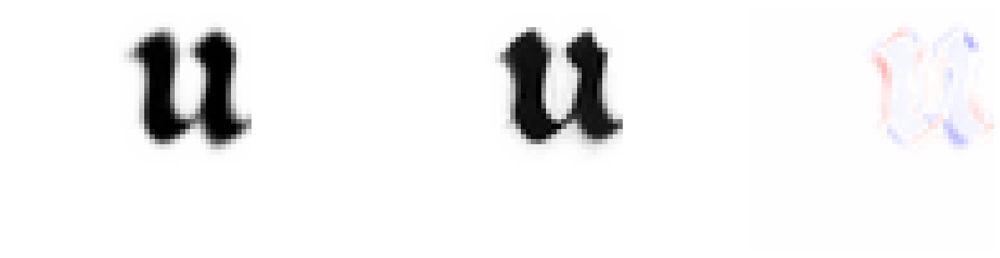

Processing folder: paper_results/prototypes/filtered/Arras-861


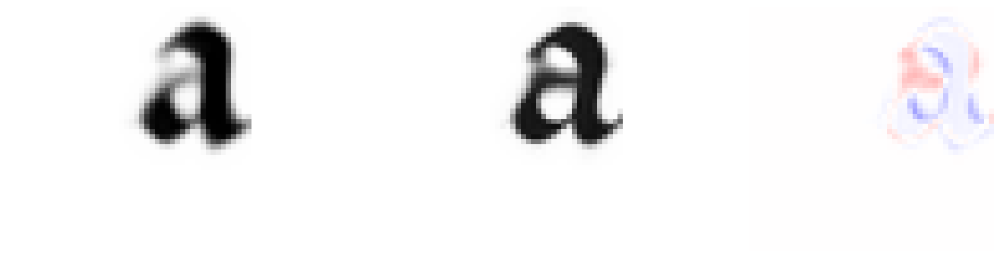

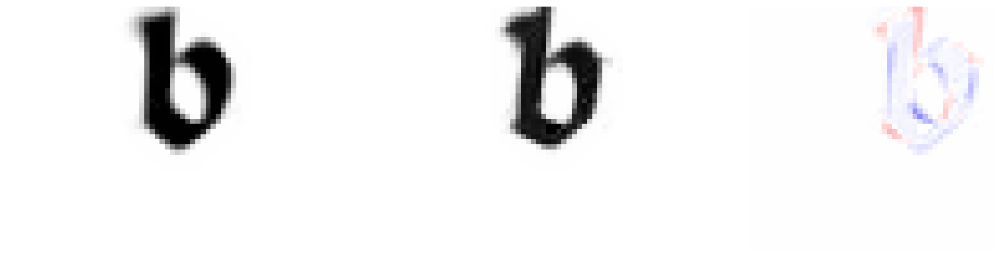

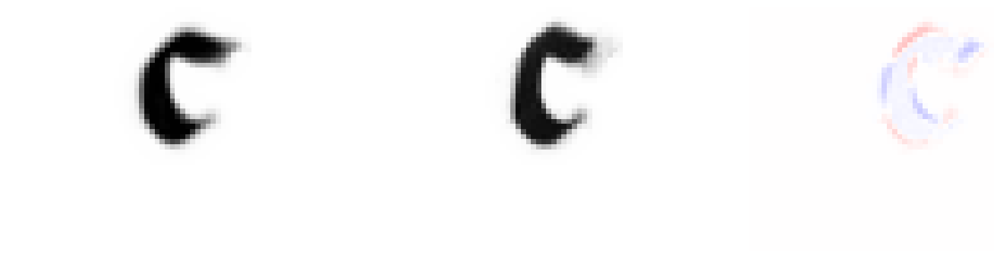

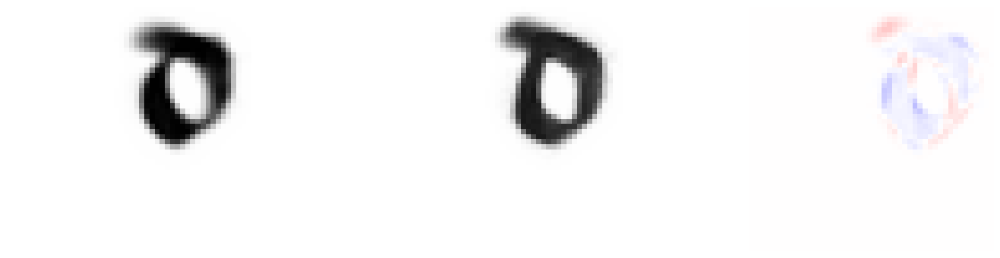

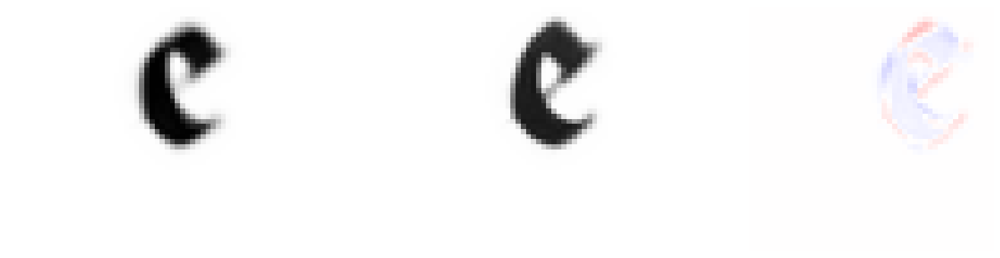

...

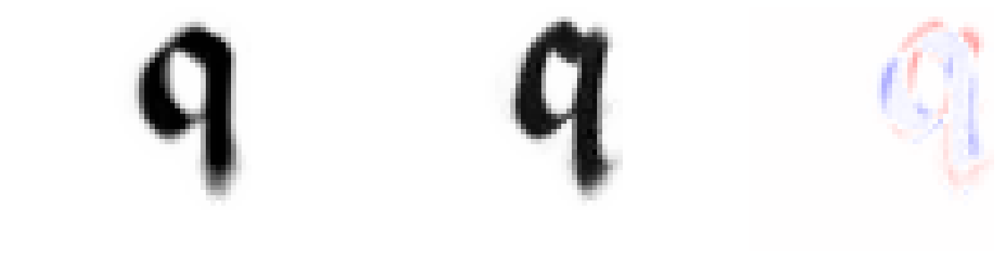

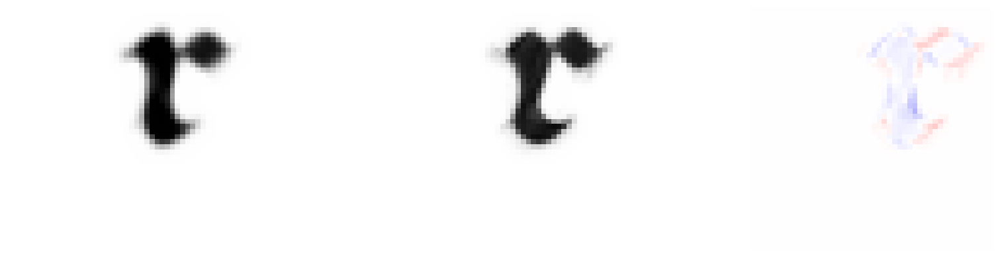

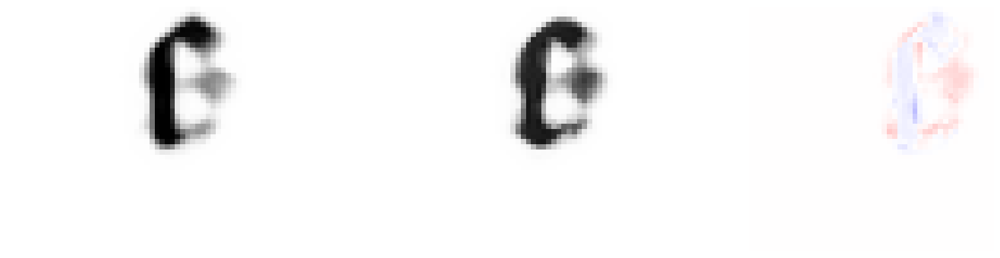

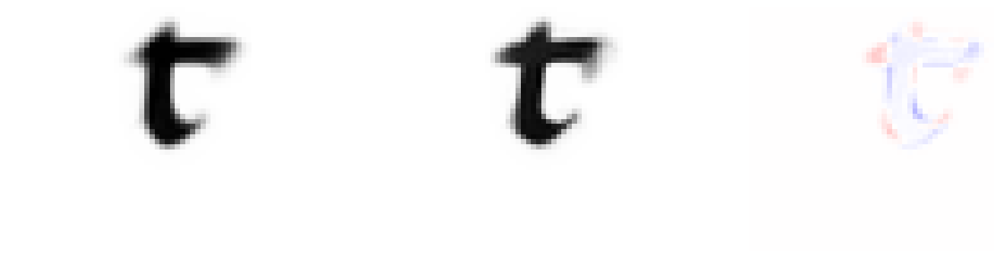

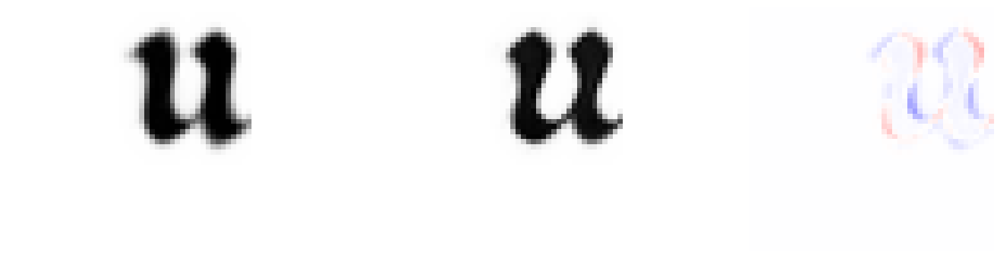

Processing folder: paper_results/prototypes/filtered/btv1b84473026


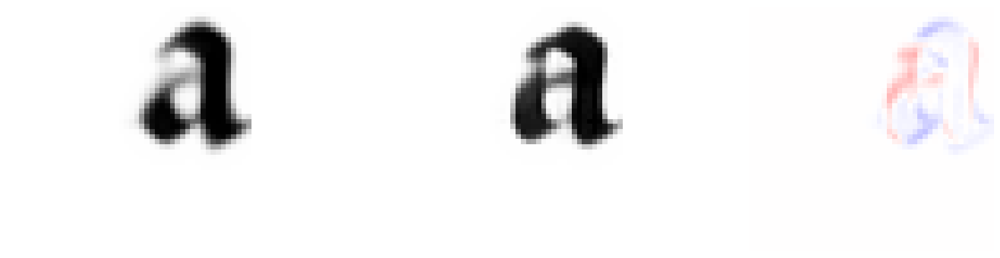

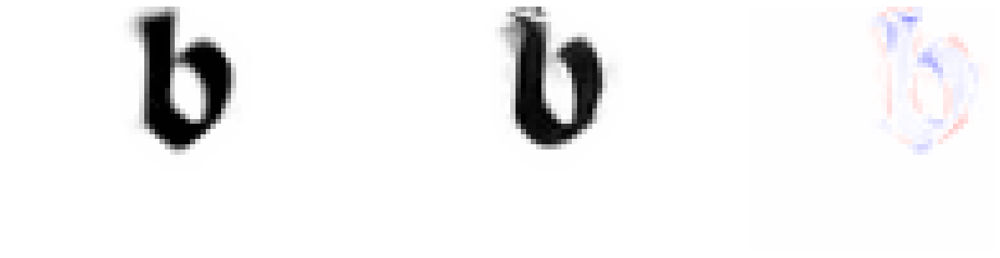

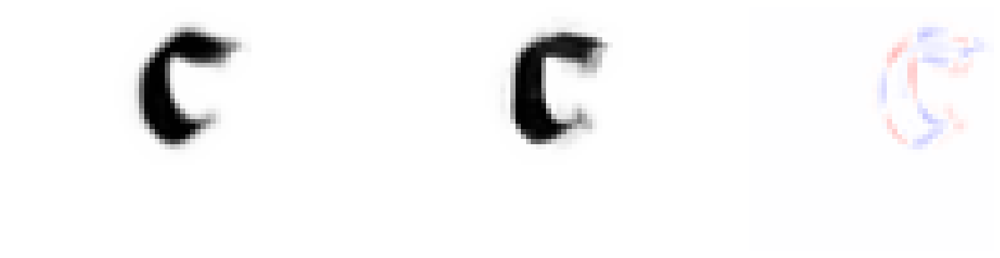

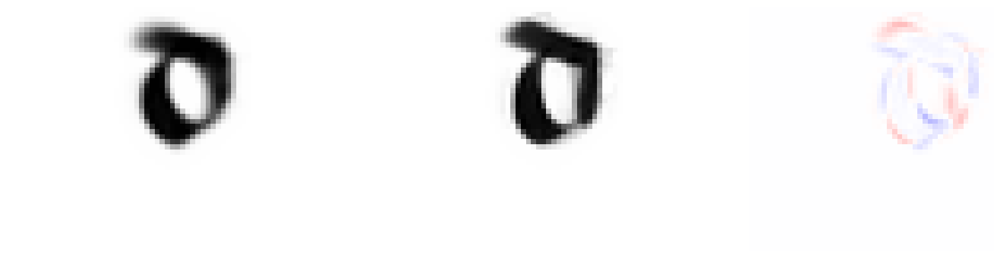

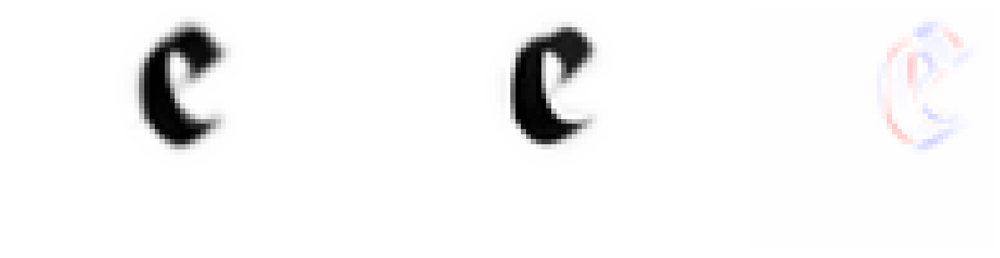

...

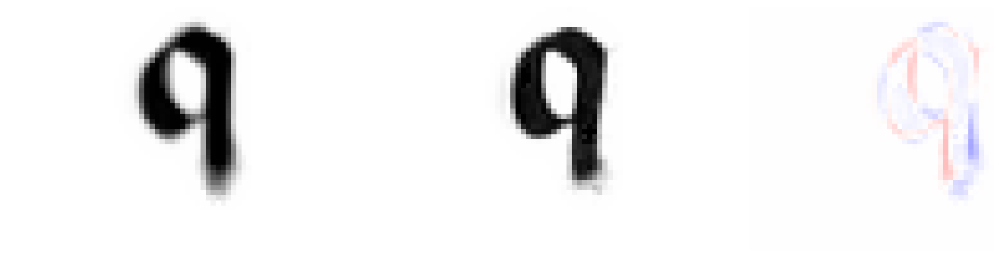

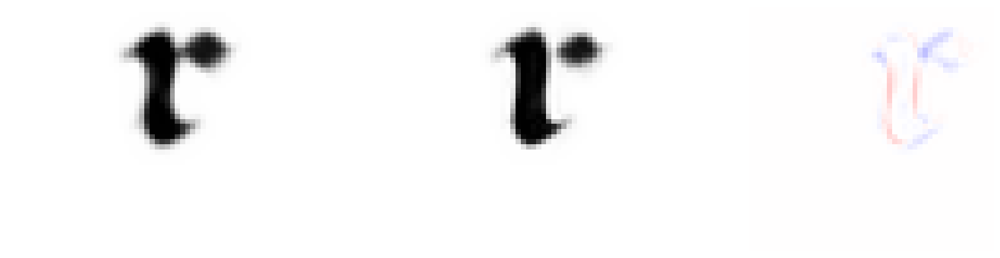

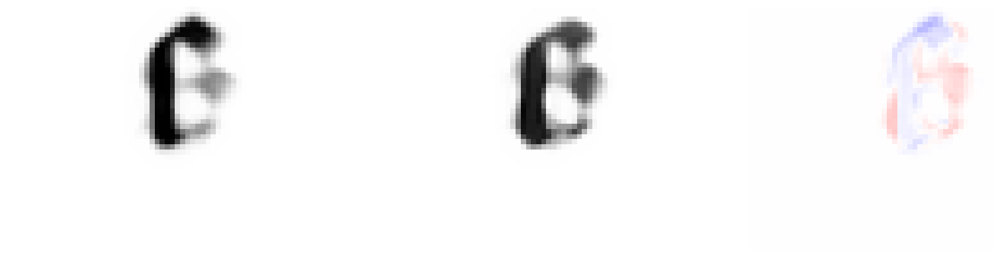

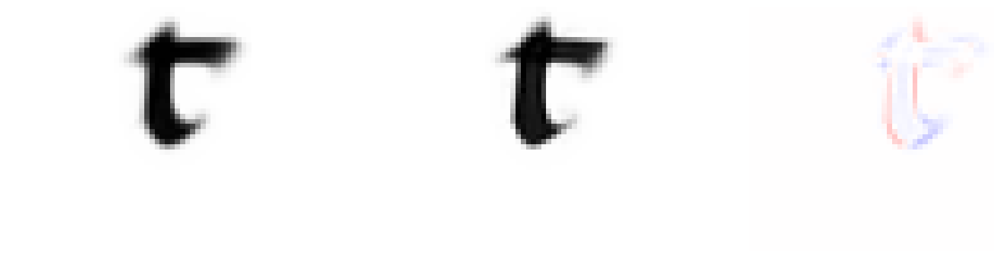

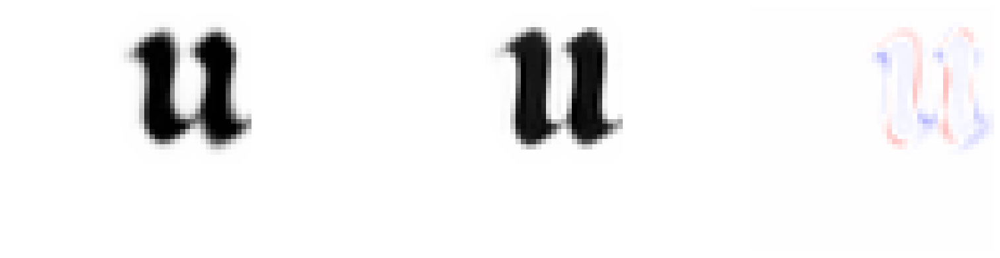

Processing folder: paper_results/prototypes/filtered/btv1b8455783p


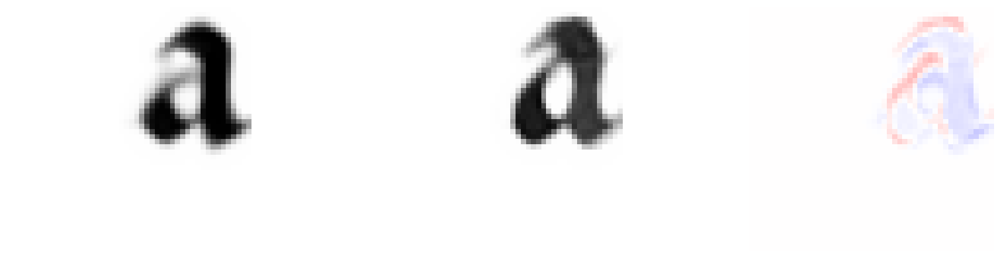

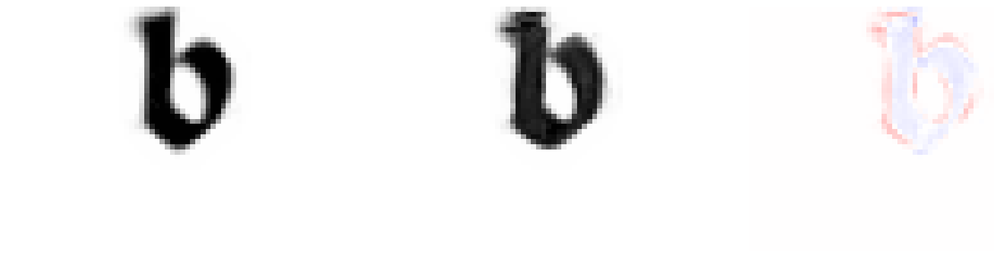

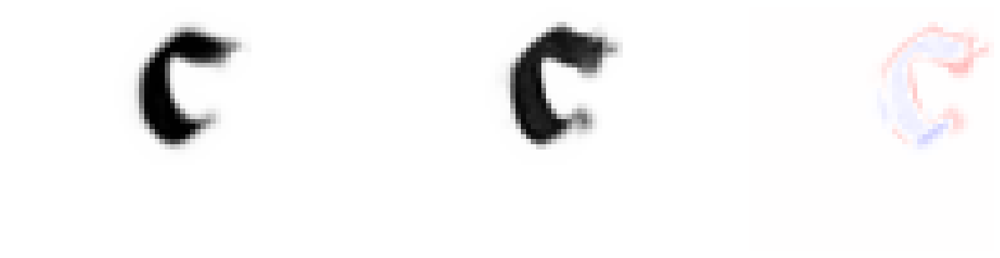

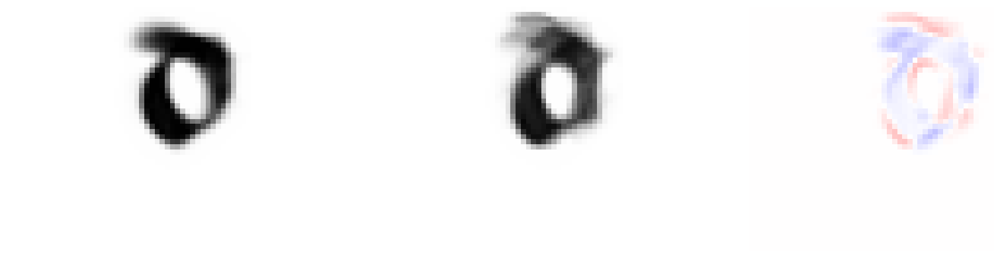

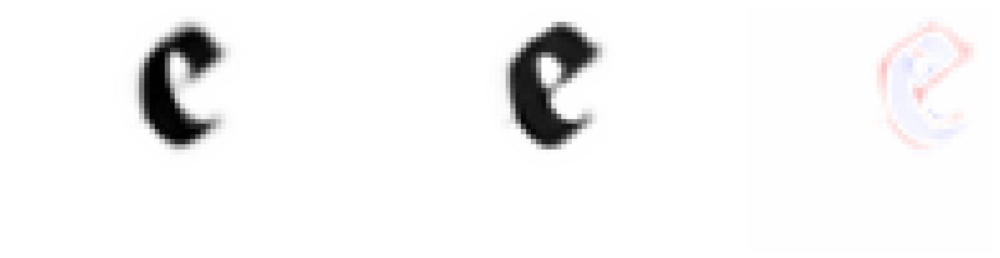

...

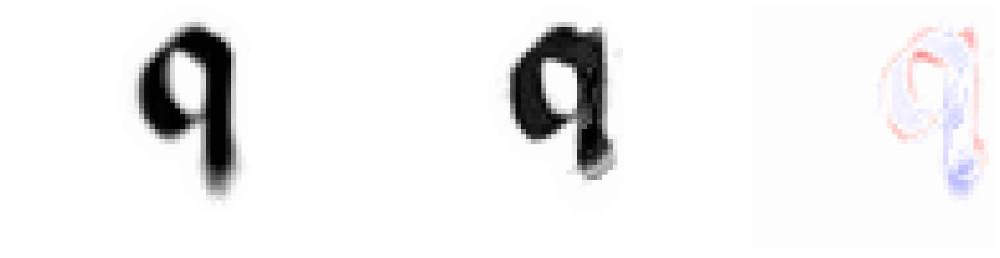

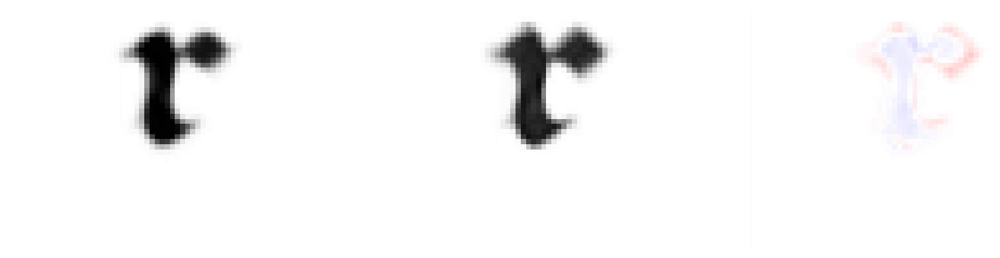

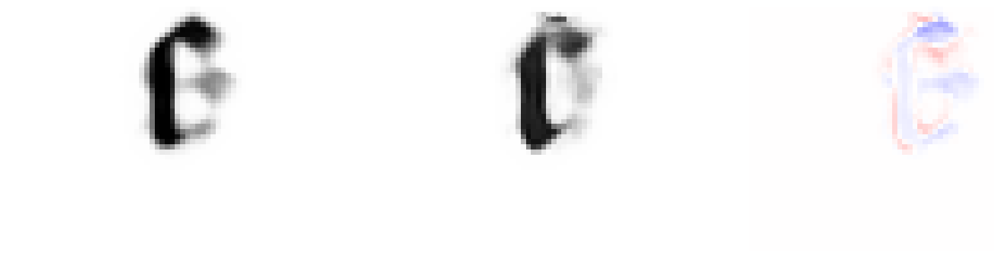

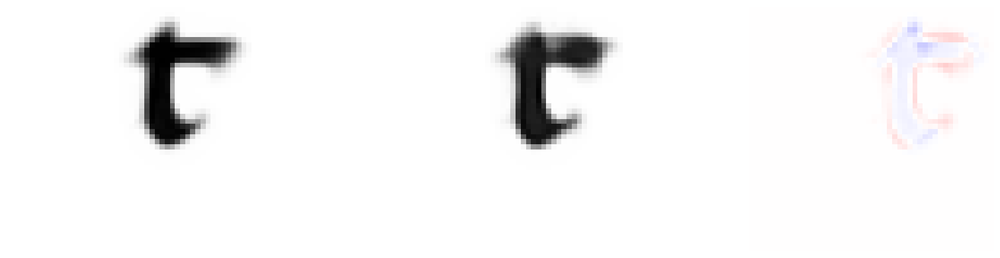

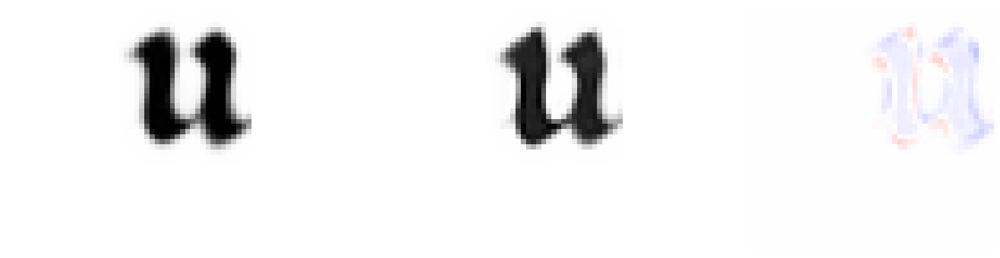

Processing folder: paper_results/prototypes/filtered/btv1b55006072j


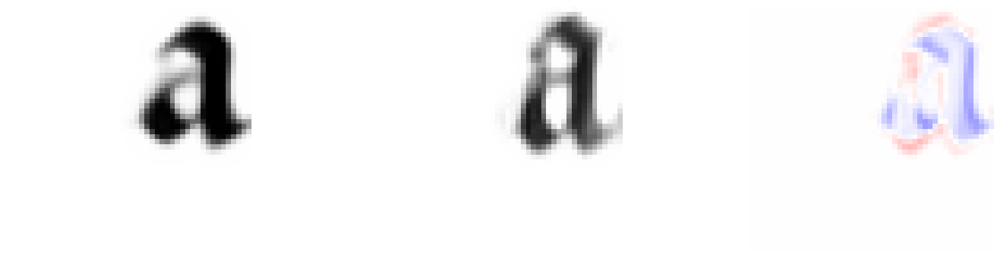

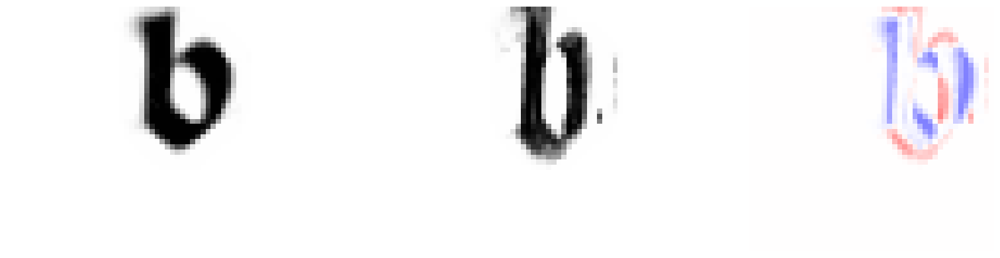

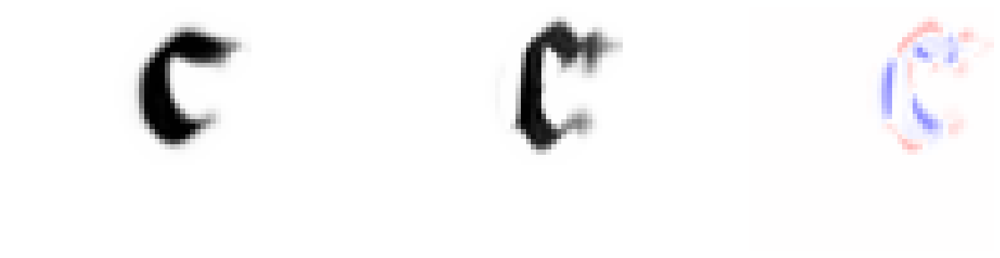

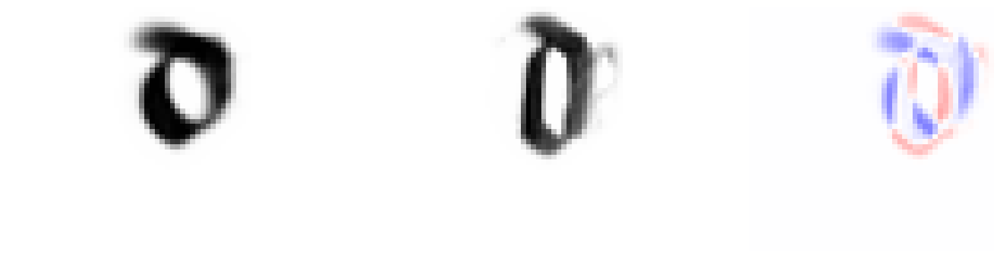

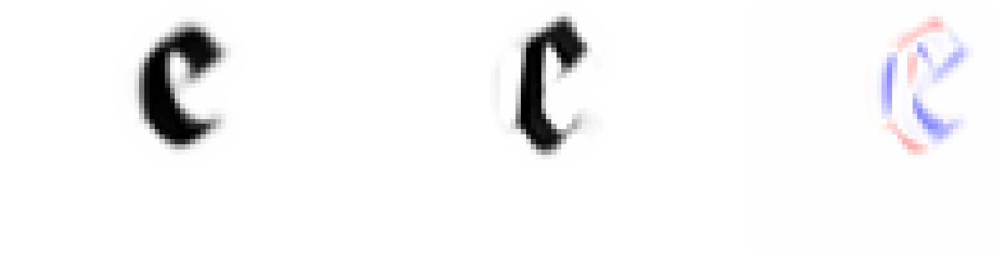

...

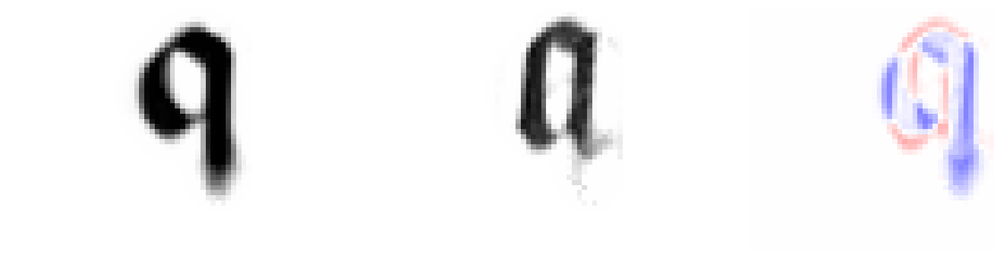

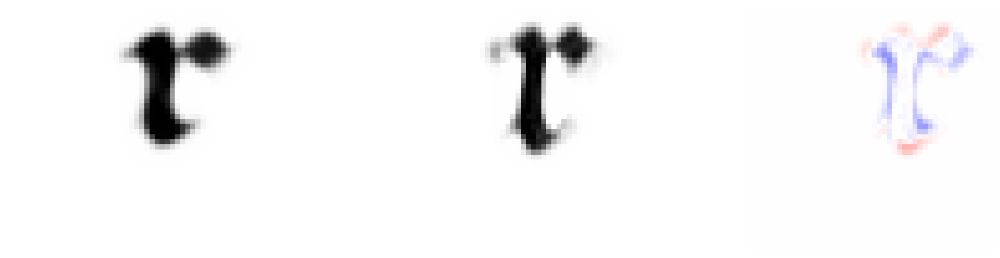

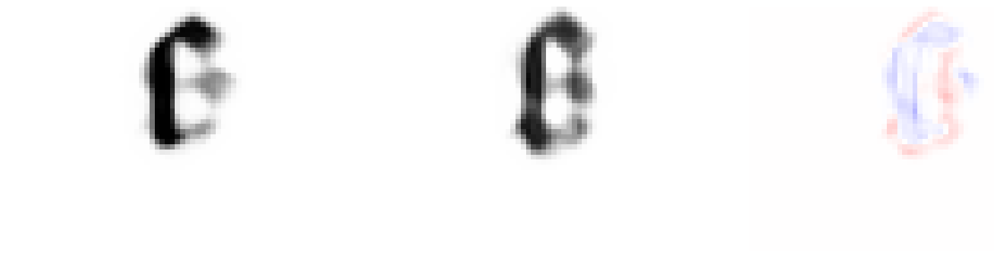

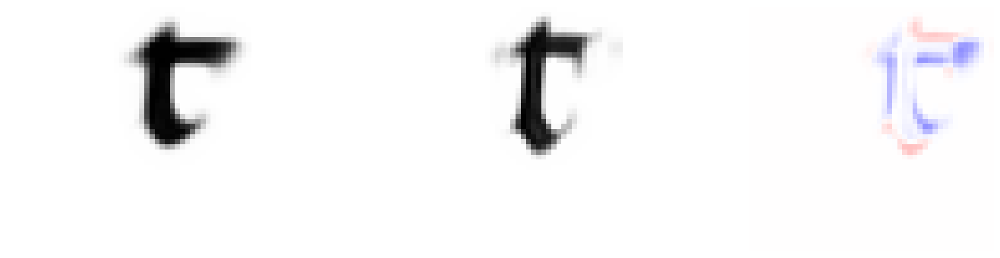

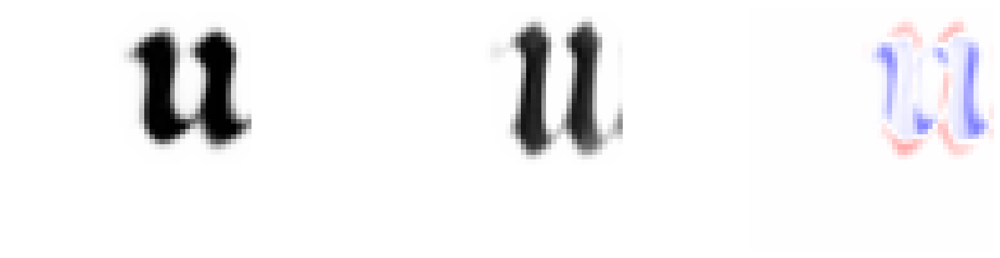

Processing folder: paper_results/prototypes/filtered/SBB-PK-Hdschr25


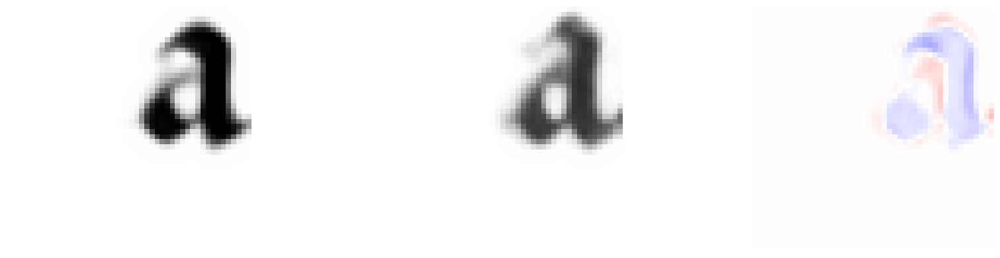

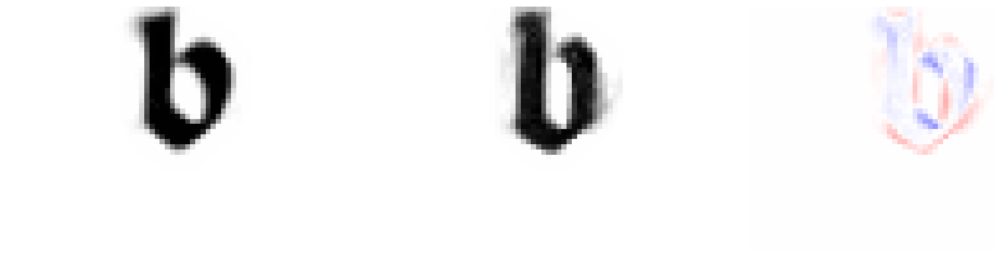

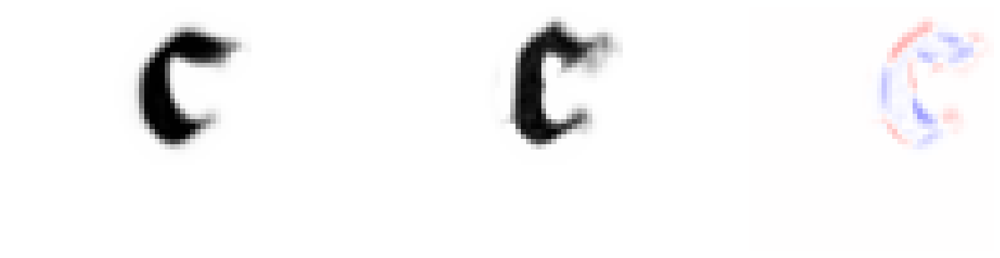

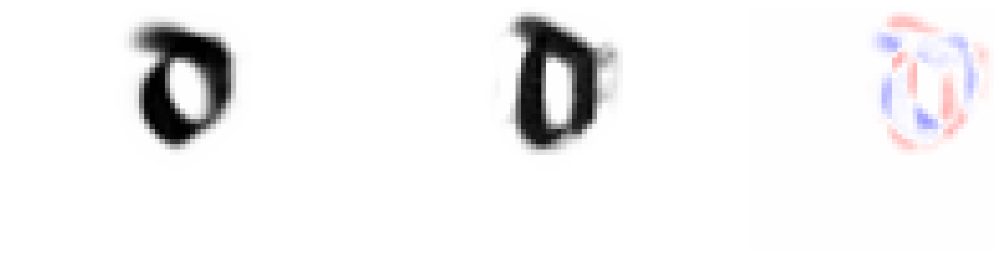

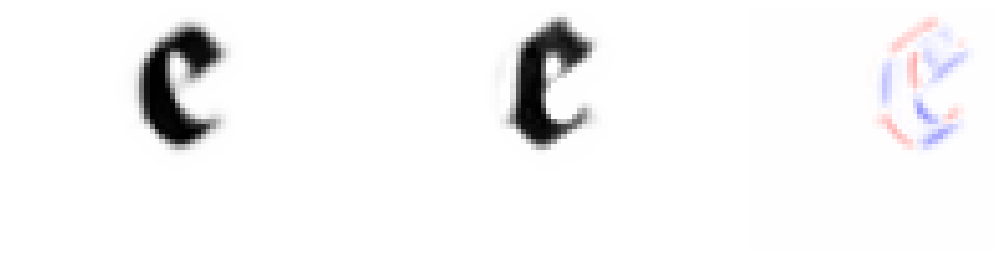

...

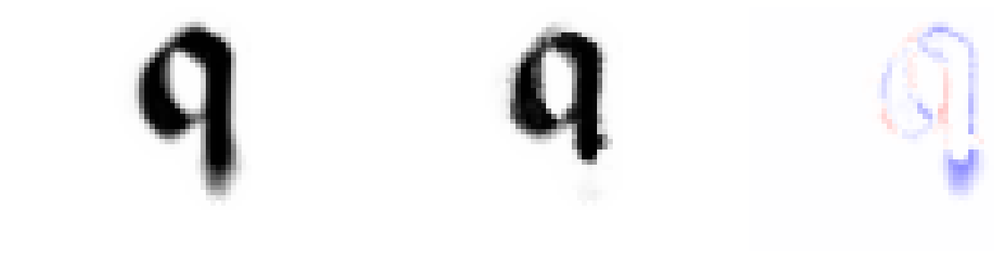

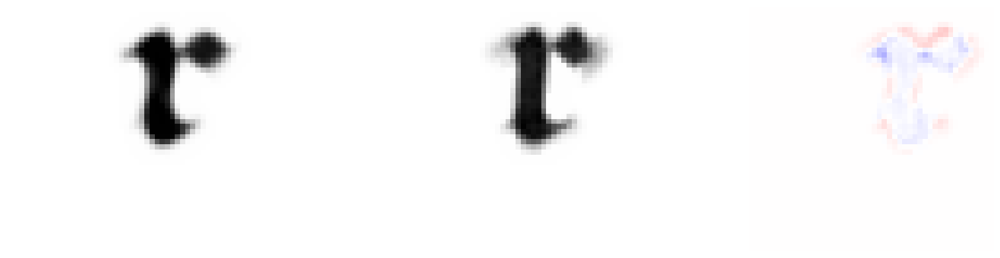

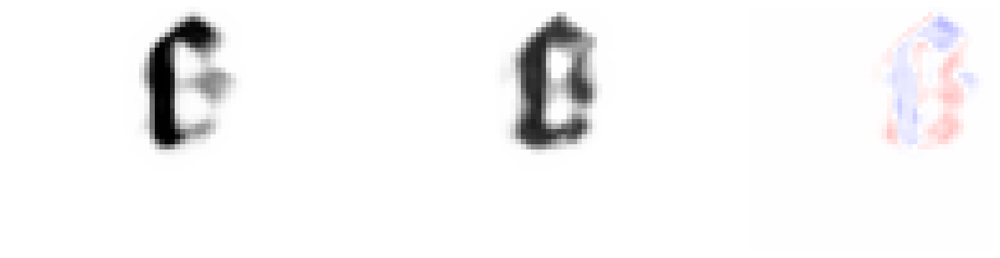

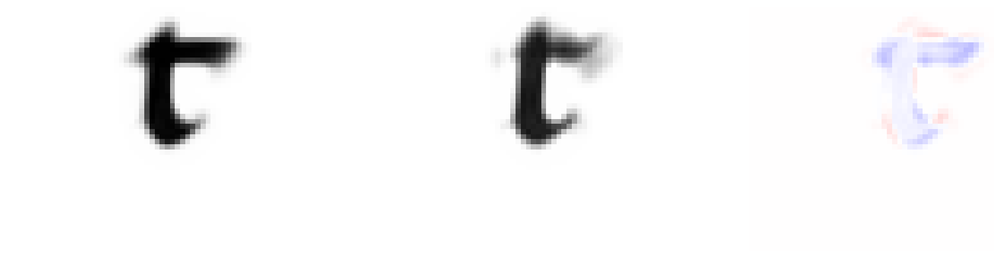

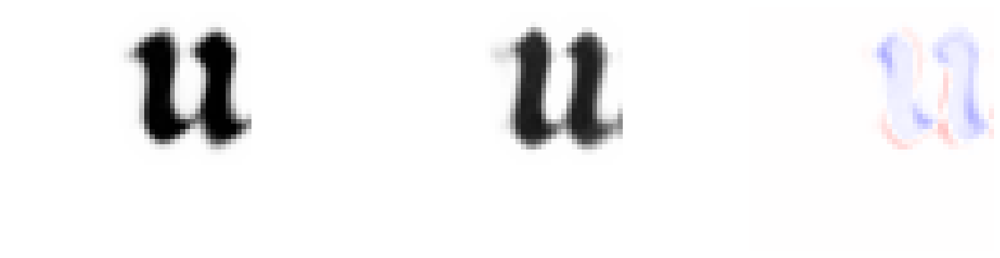

Processing folder: paper_results/prototypes/filtered/Southern_Textualis


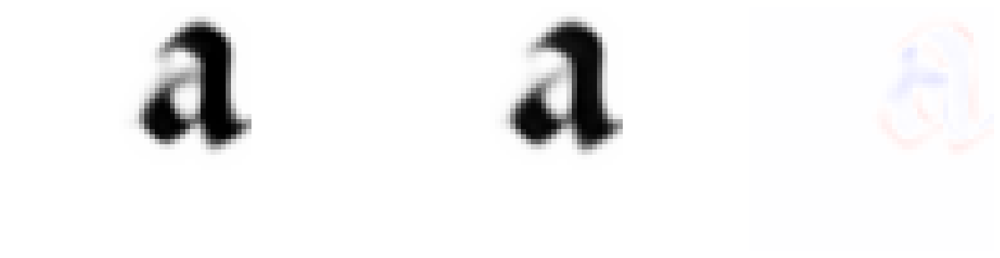

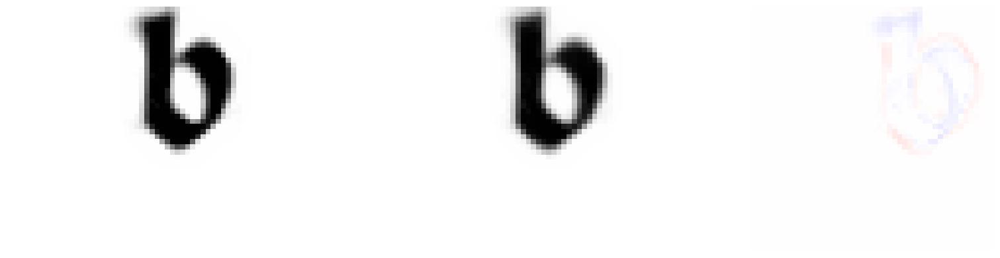

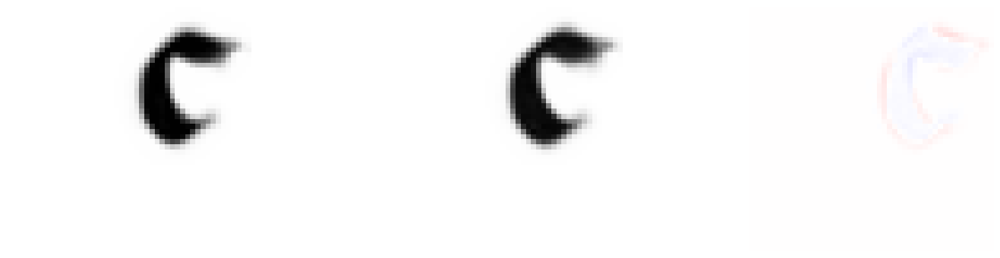

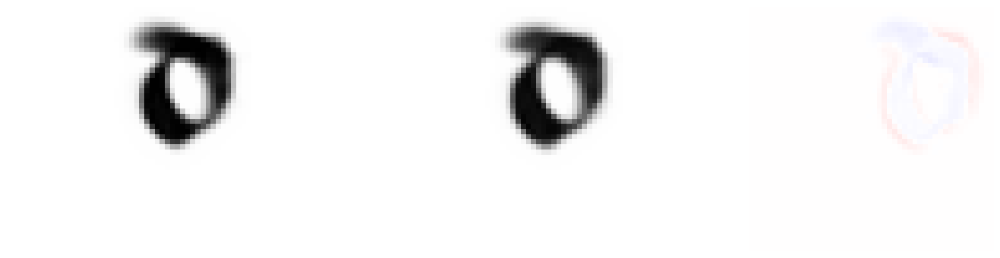

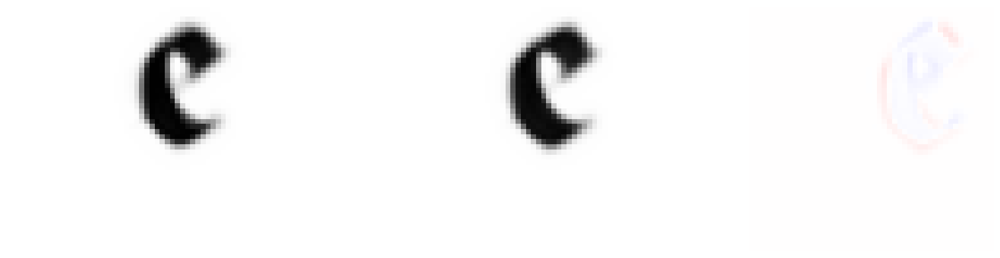

...

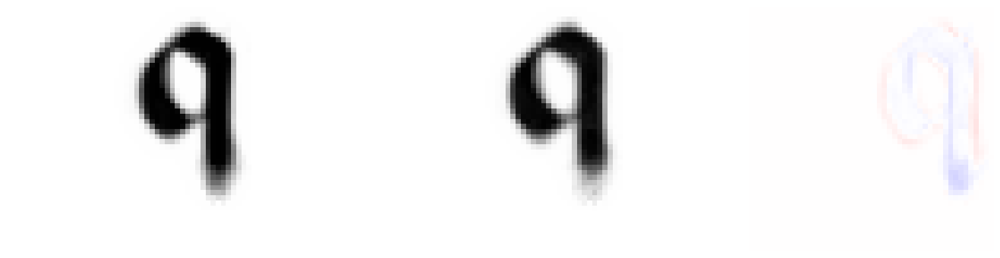

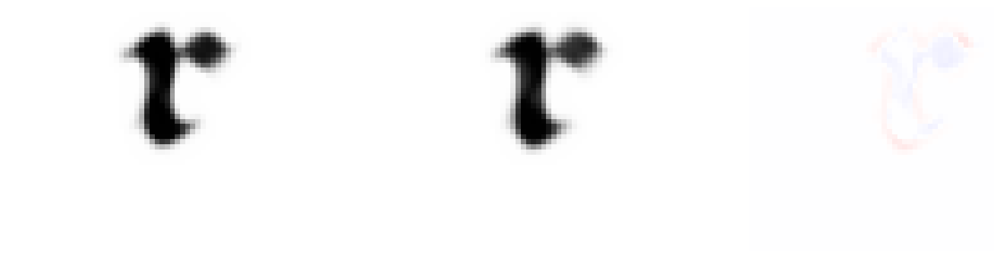

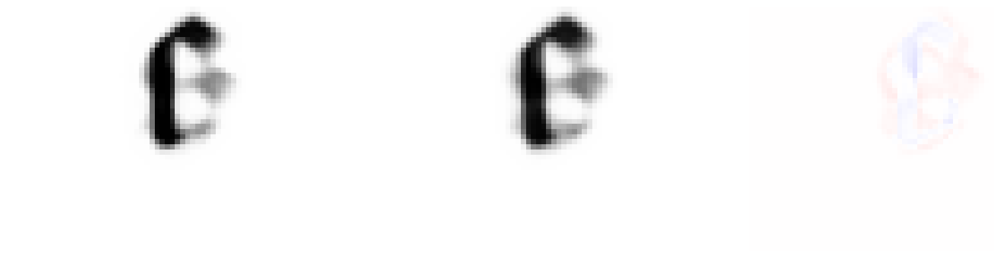

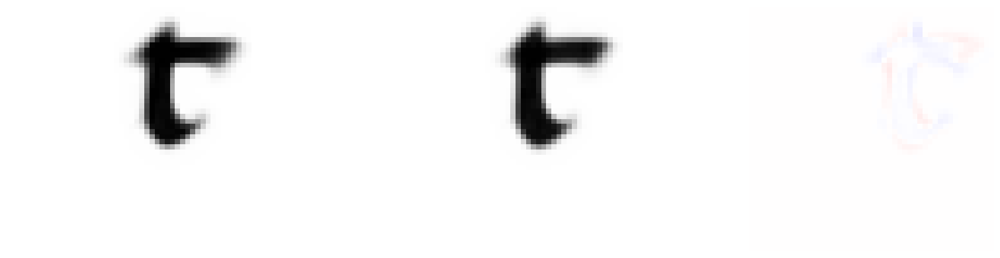

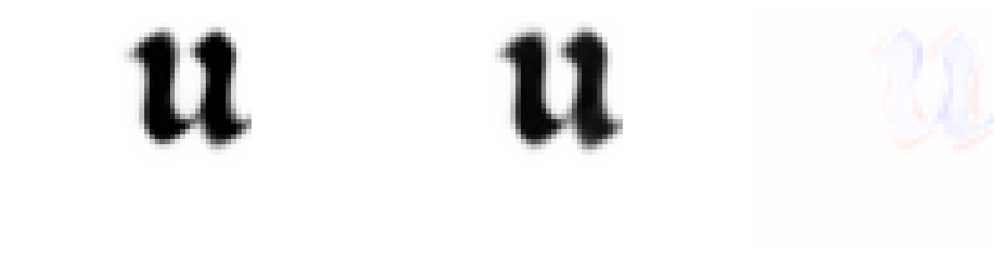

Processing folder: paper_results/prototypes/filtered/btv1b90615126


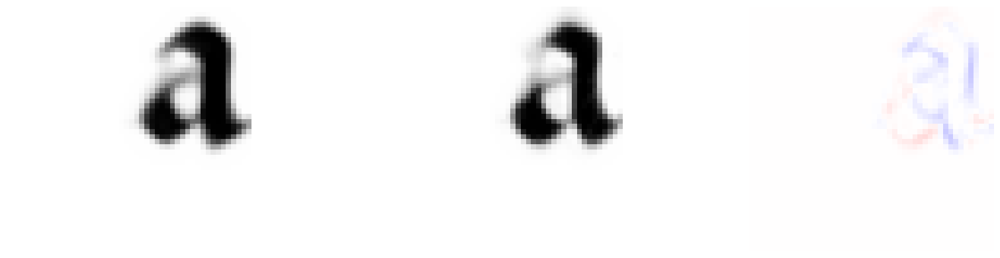

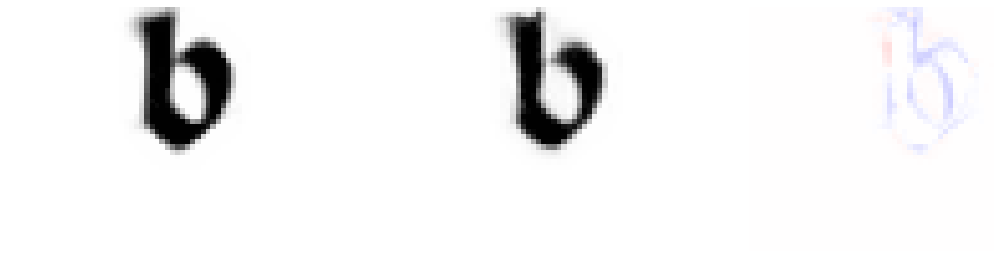

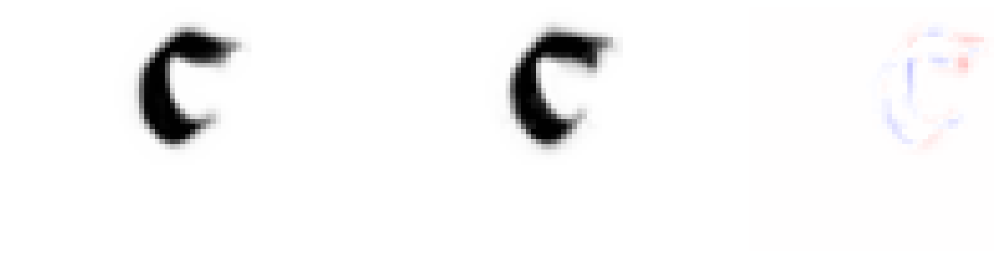

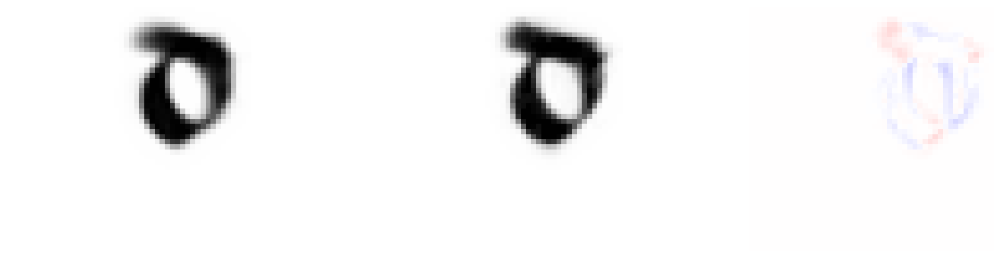

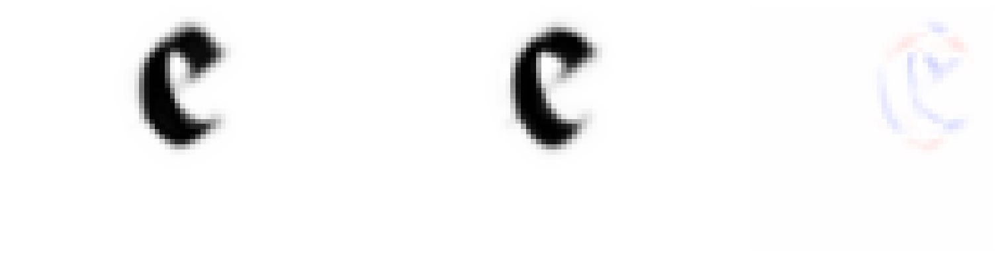

...

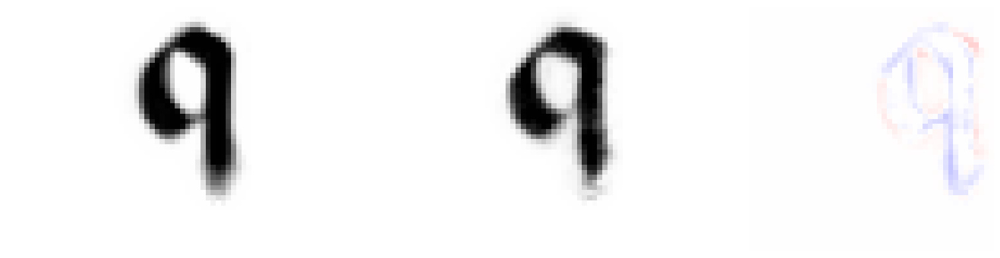

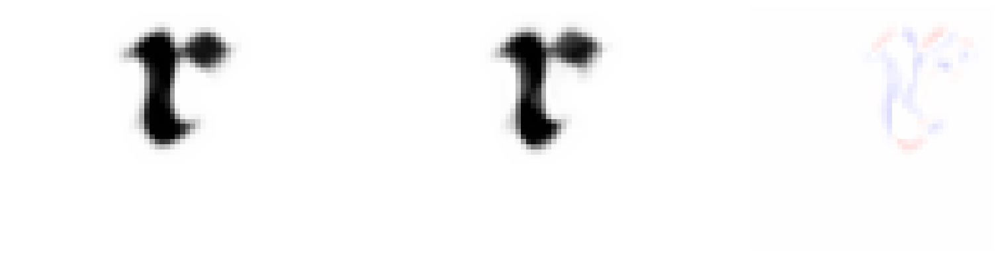

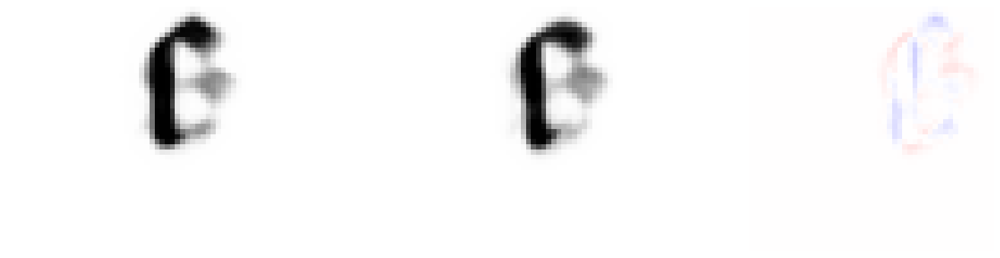

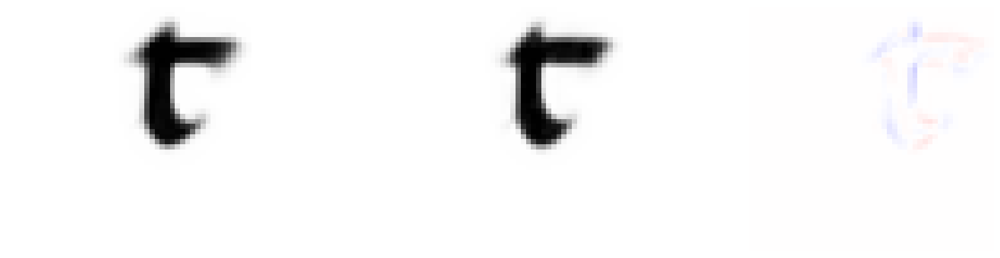

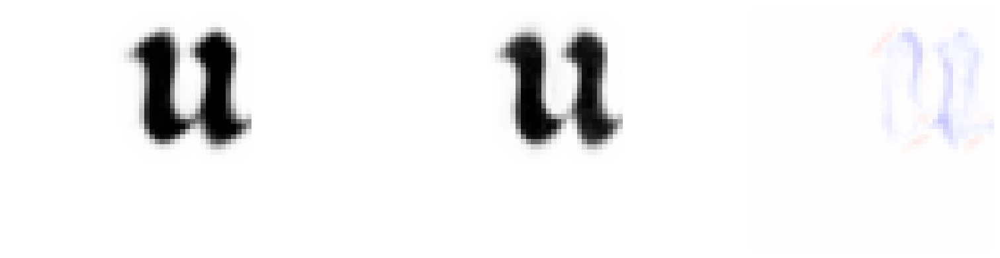

Processing folder: paper_results/prototypes/filtered/btv1b100361755


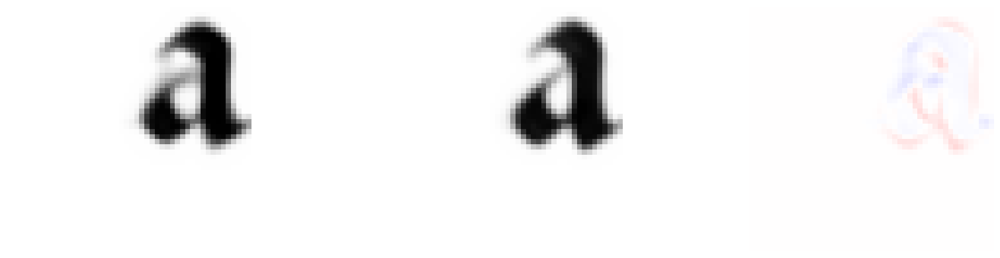

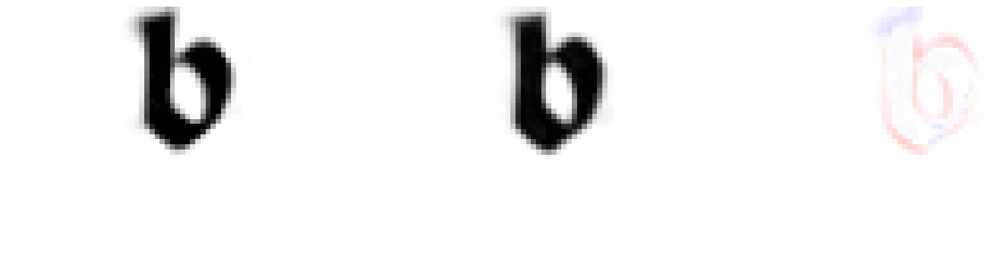

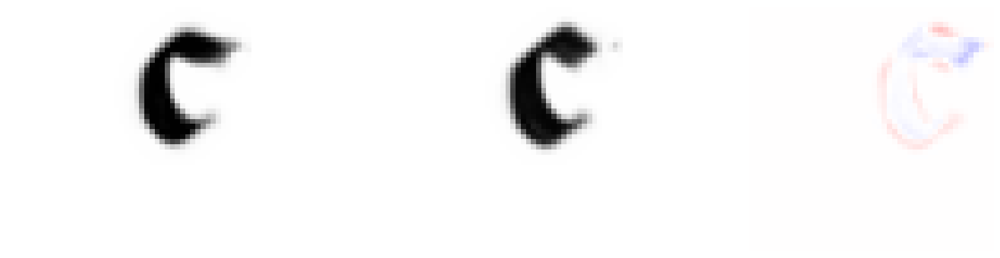

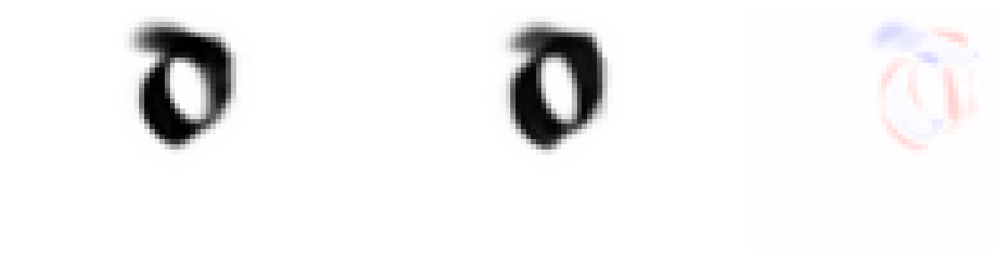

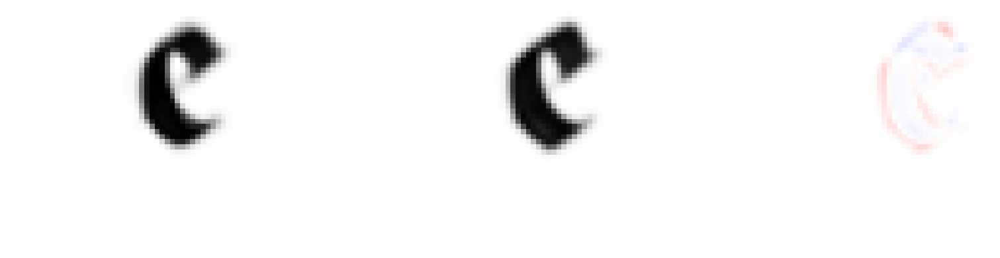

...

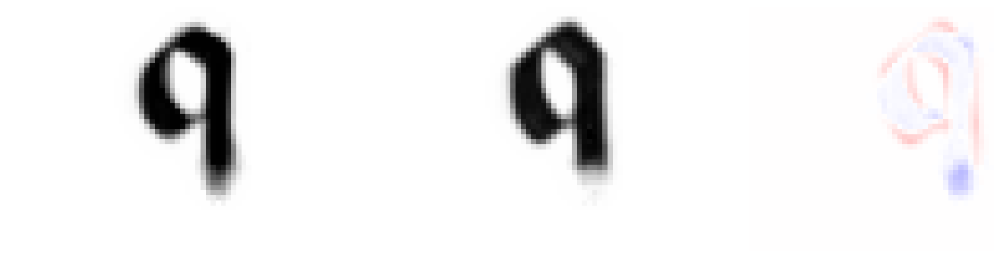

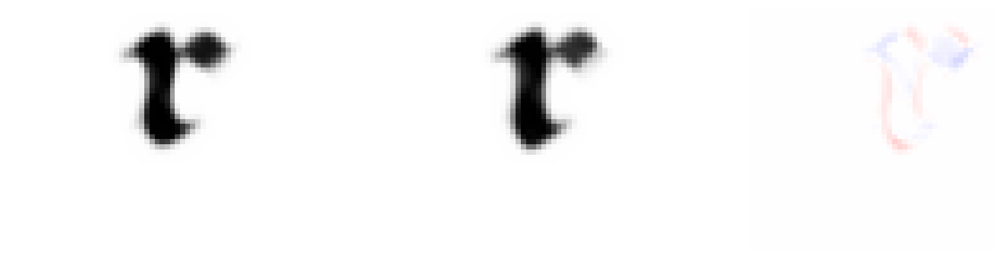

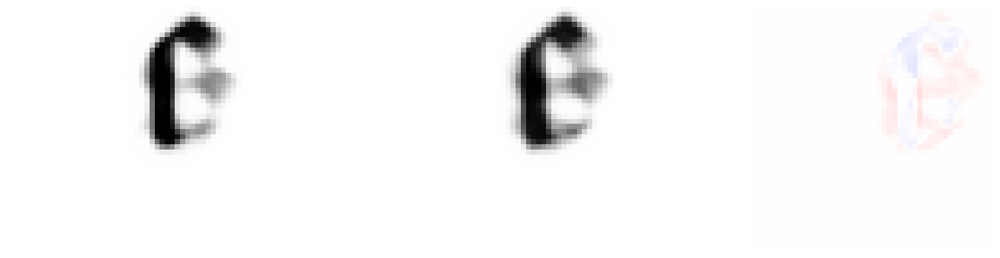

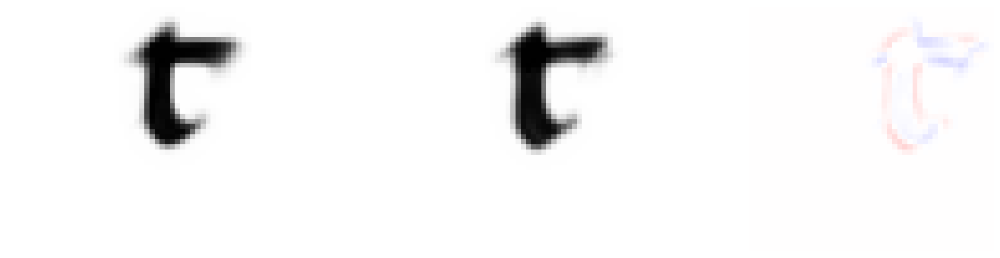

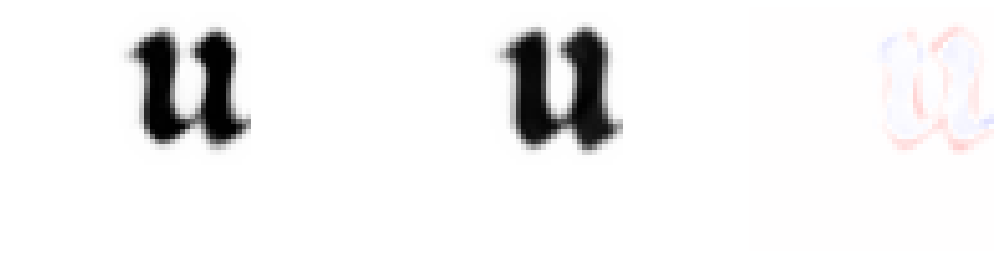

Processing folder: paper_results/prototypes/filtered/btv1b8433319z


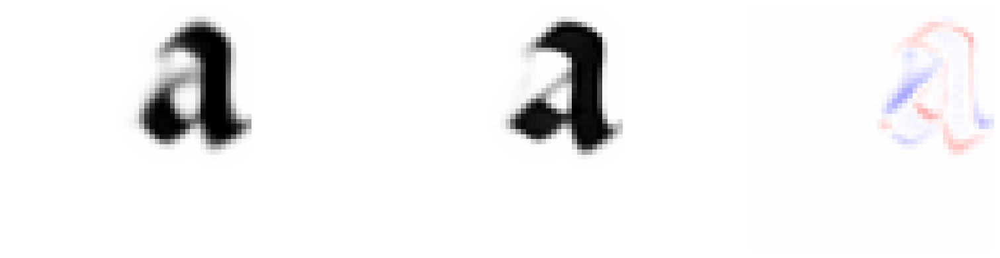

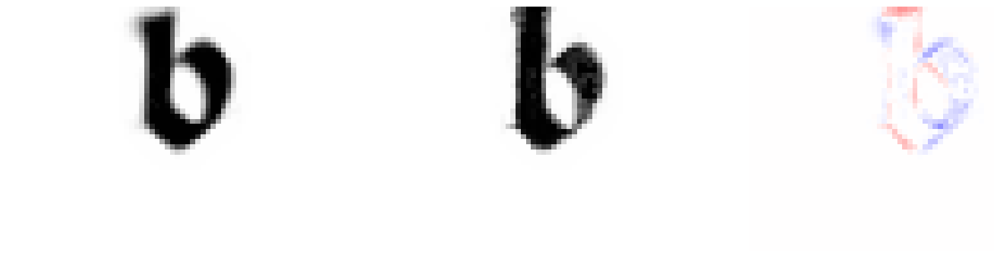

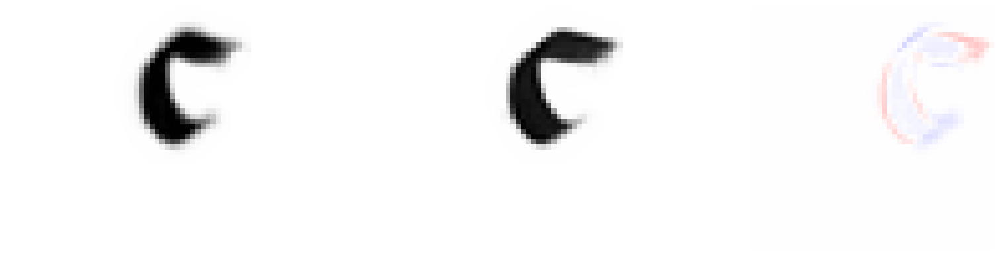

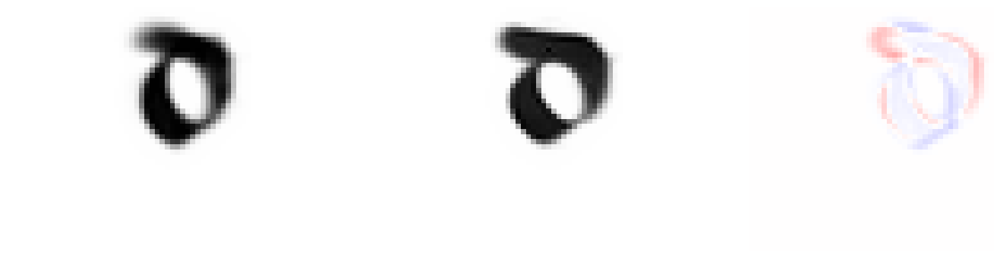

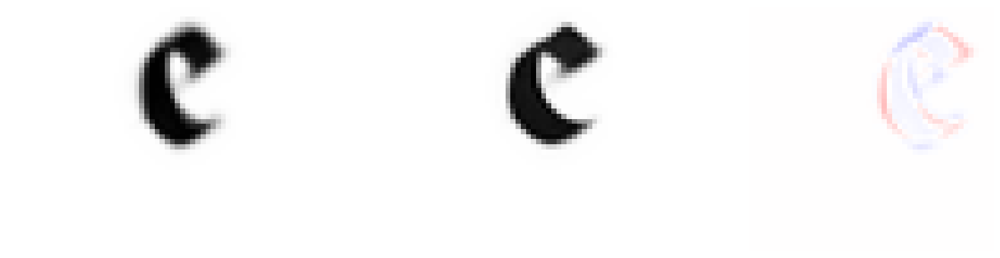

...

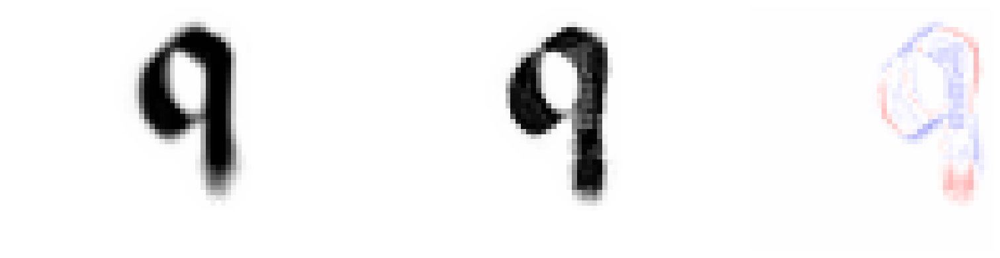

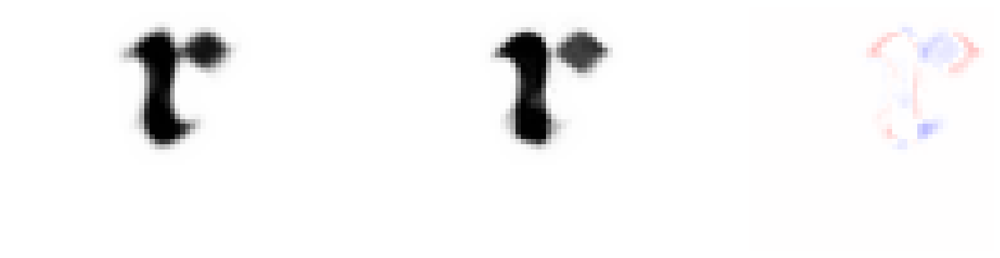

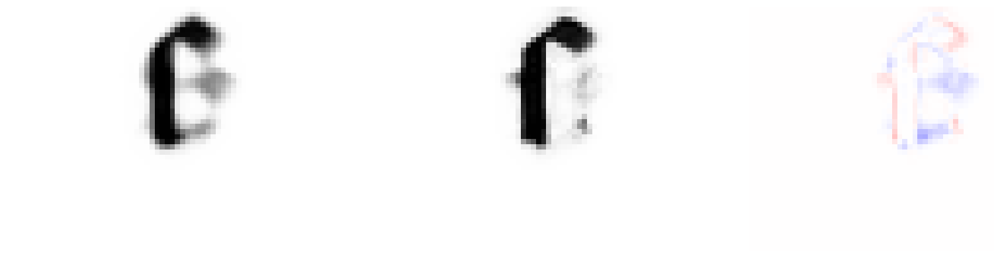

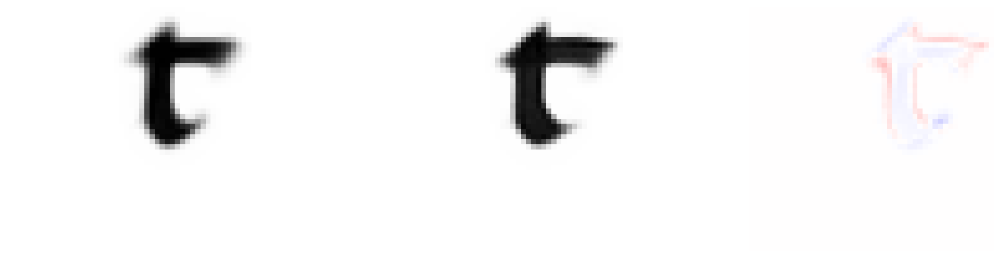

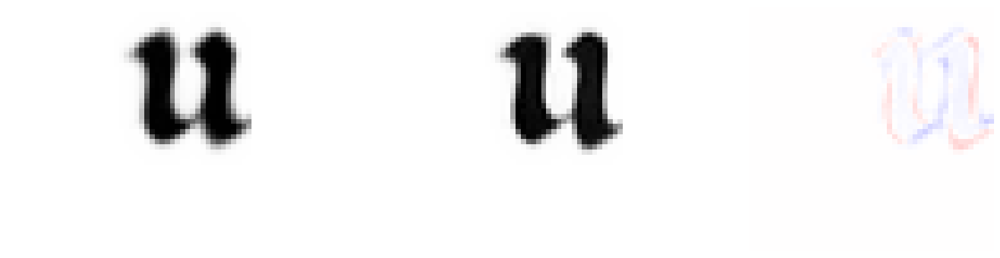

Processing folder: paper_results/prototypes/filtered/IB15304245v


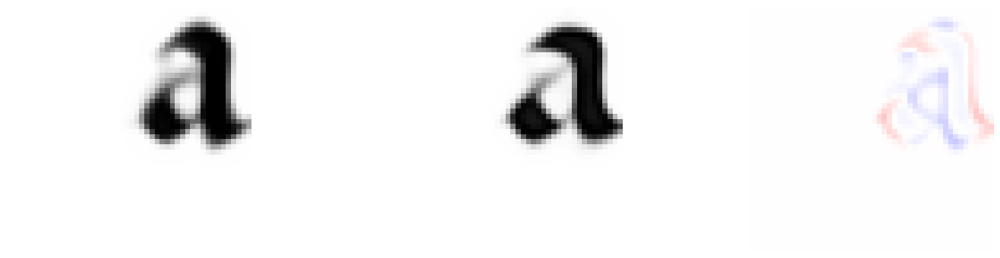

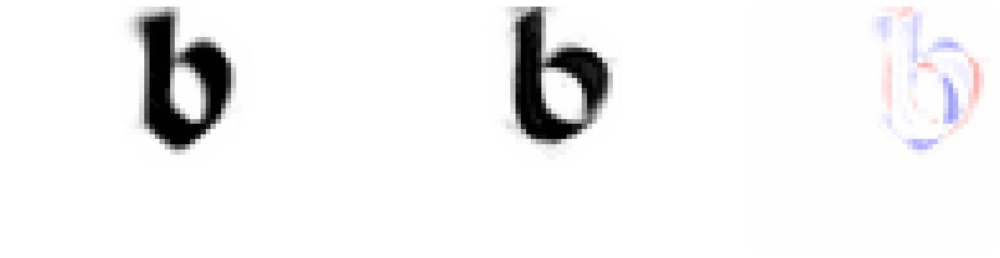

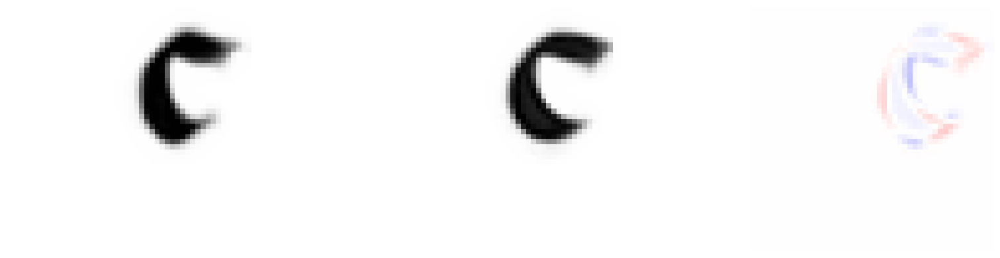

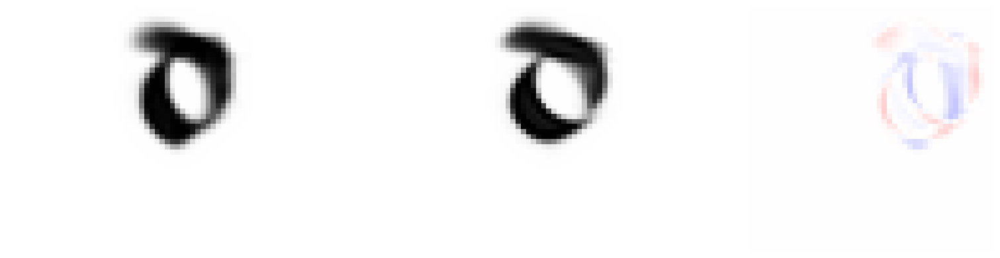

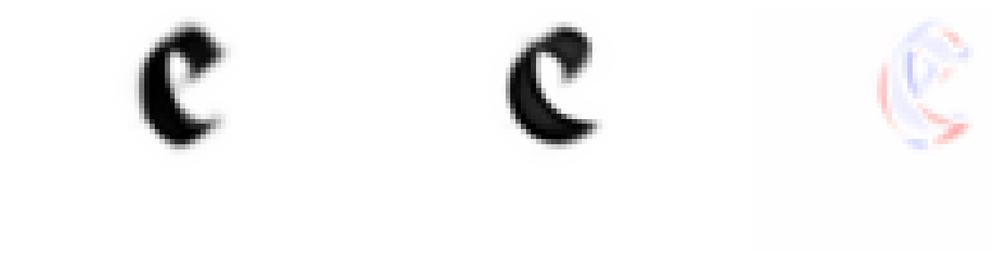

...

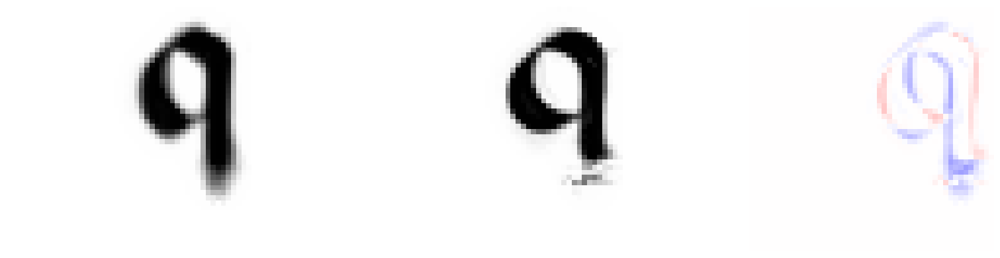

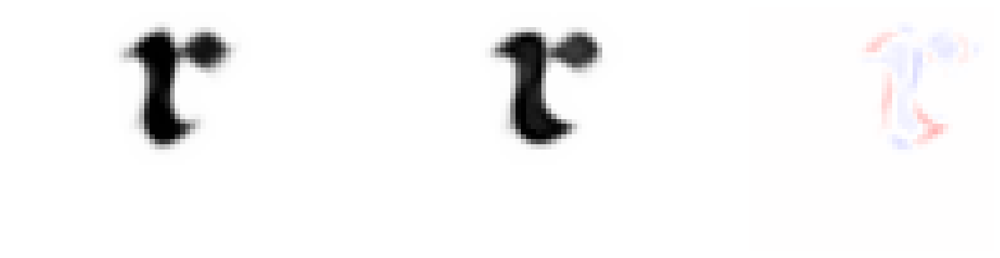

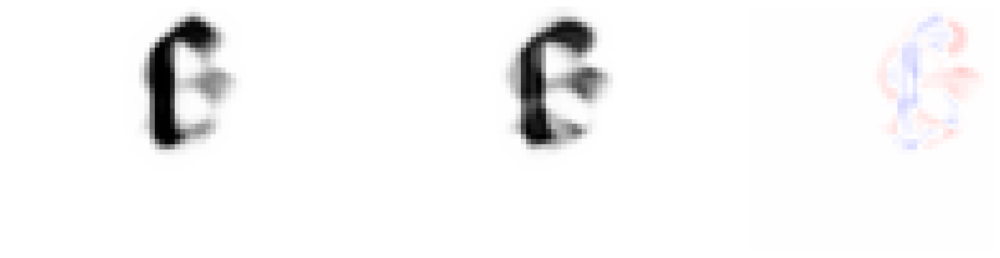

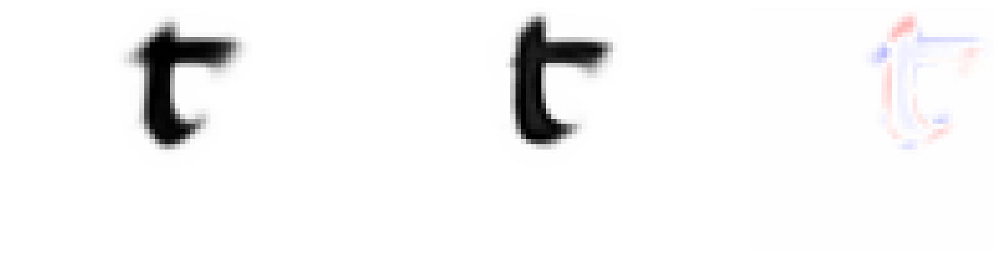

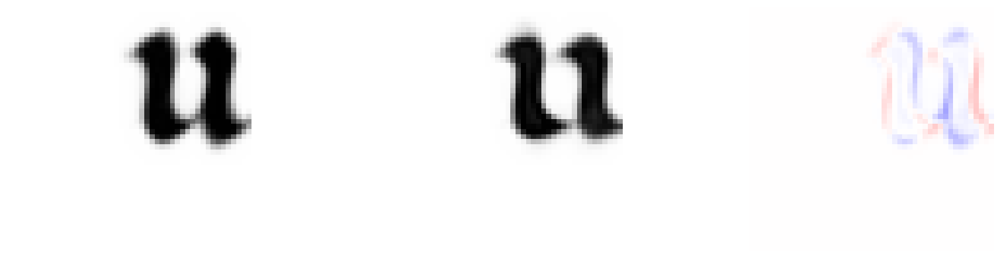

Processing folder: paper_results/prototypes/filtered/btv1b90590259


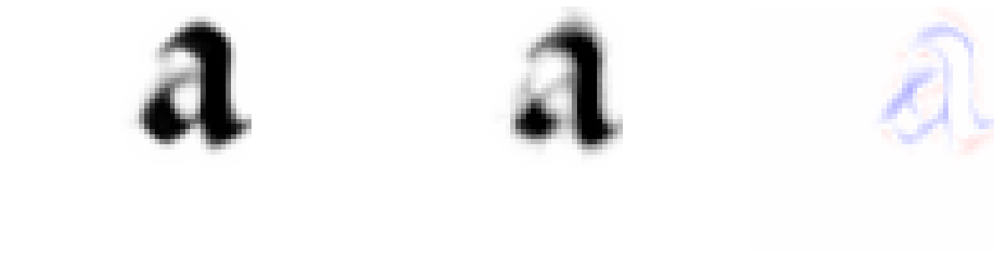

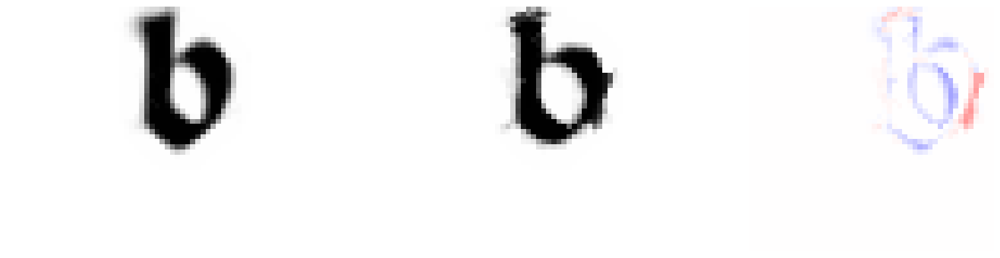

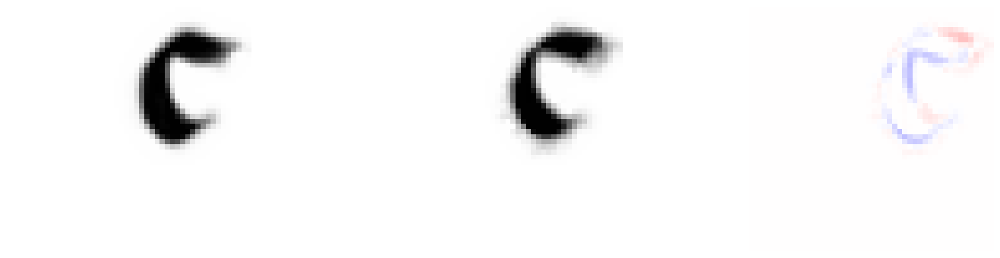

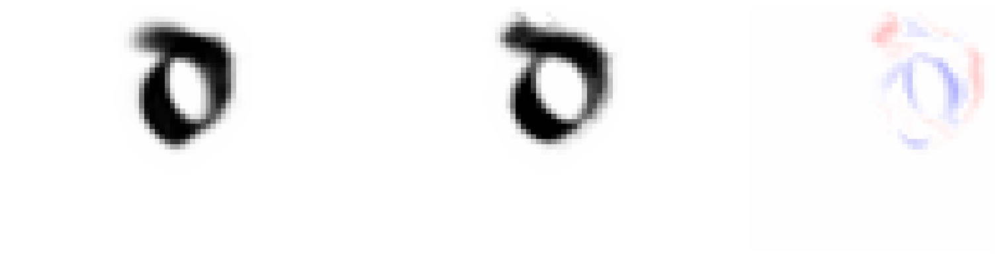

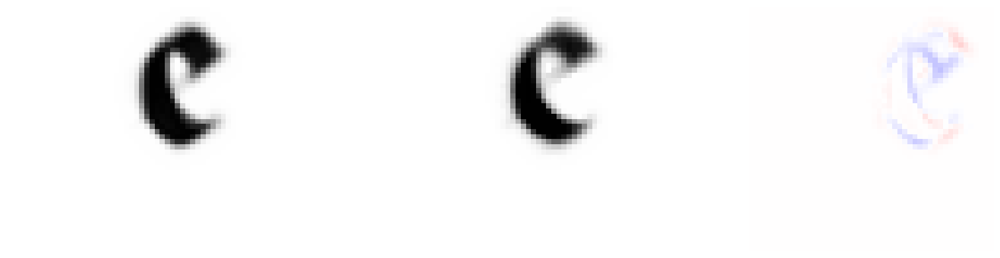

...

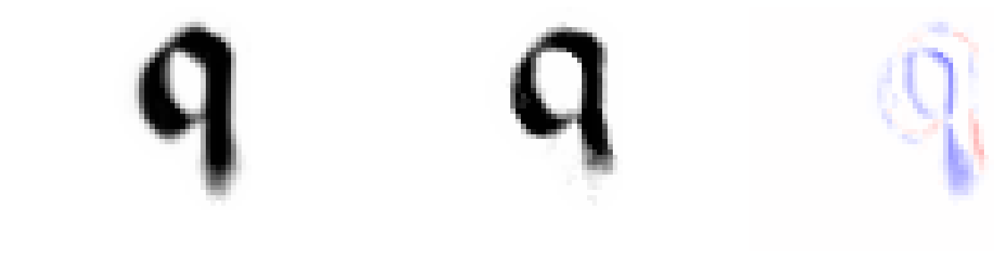

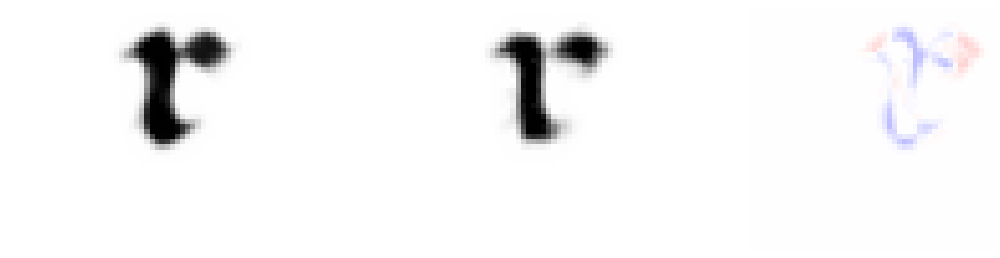

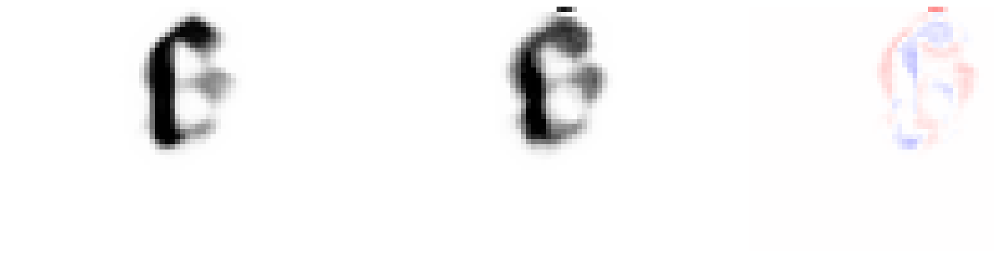

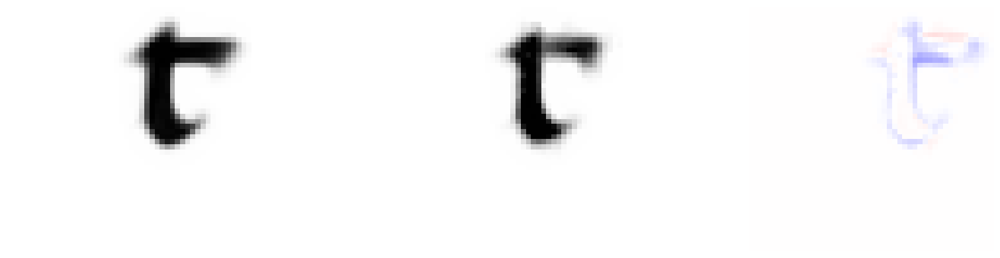

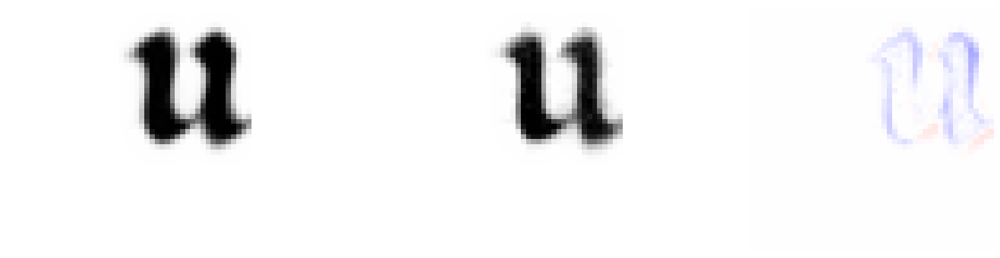

Processing folder: paper_results/prototypes/filtered/btv1b8446940n


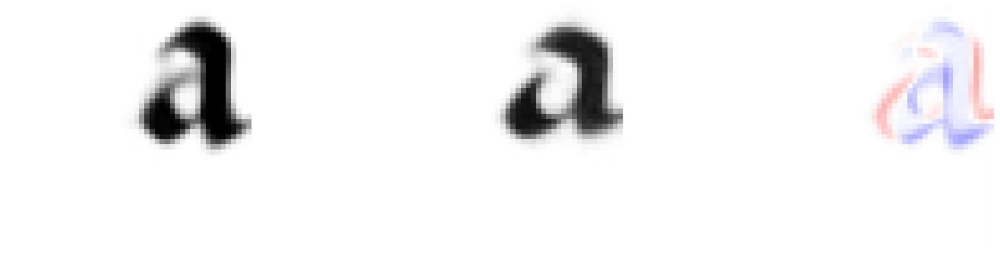

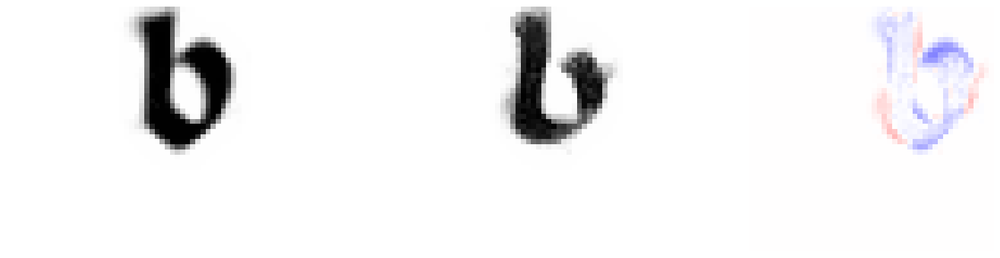

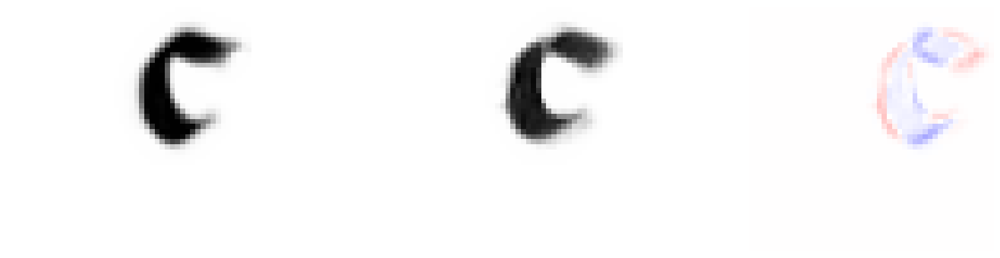

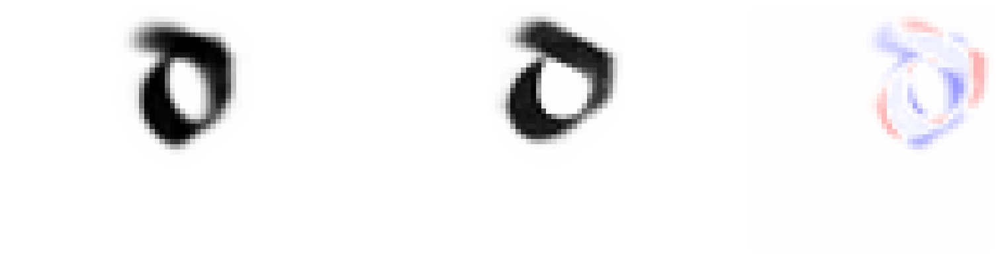

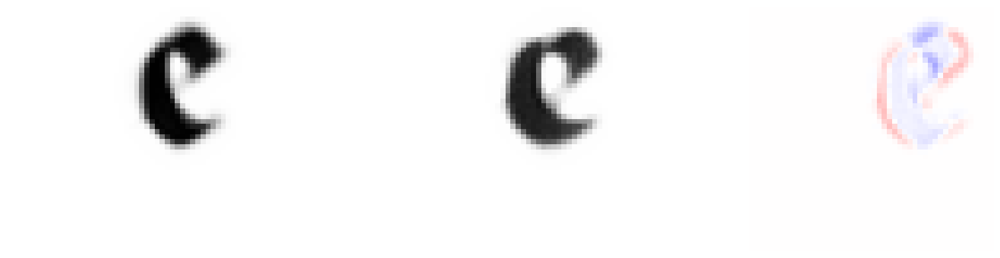

...

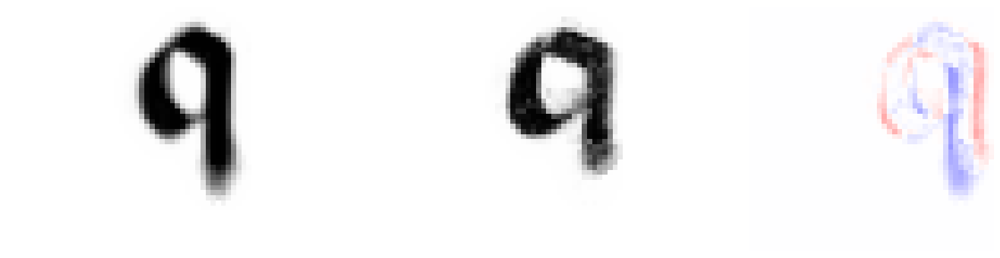

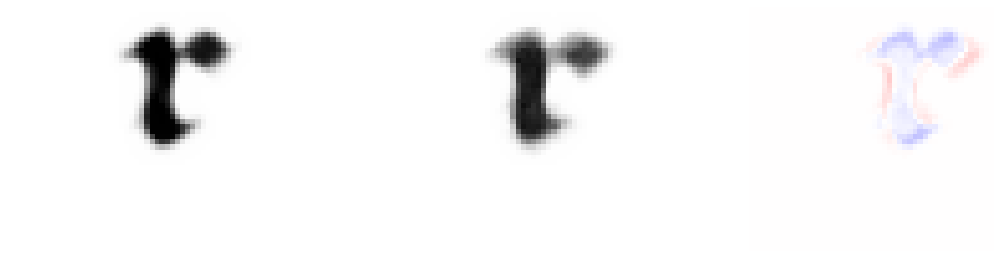

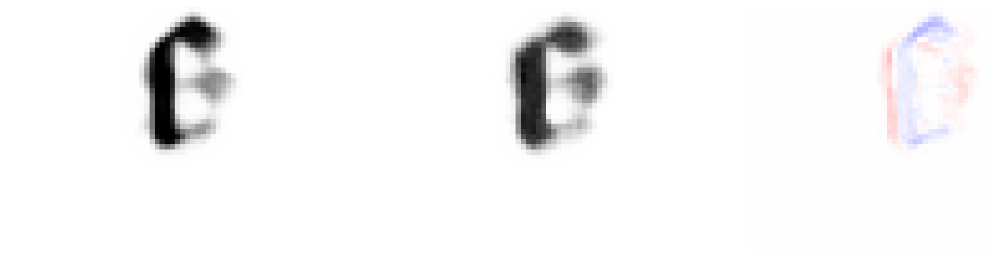

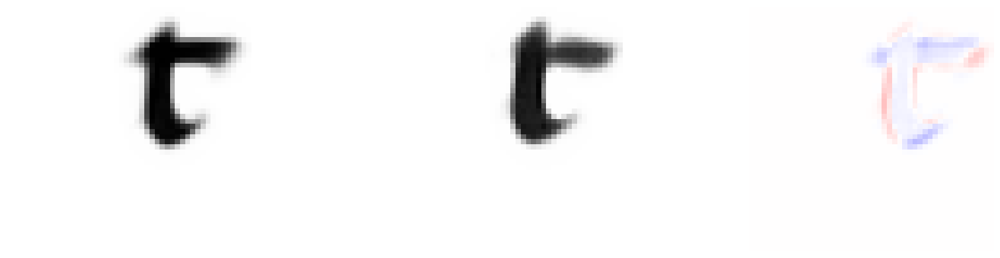

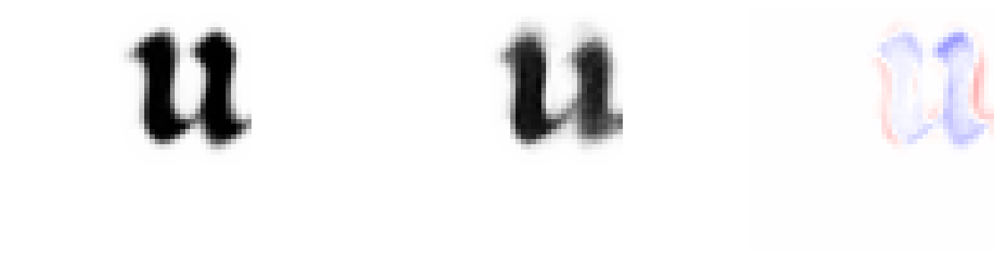

Processing folder: paper_results/prototypes/filtered/IB15304274v


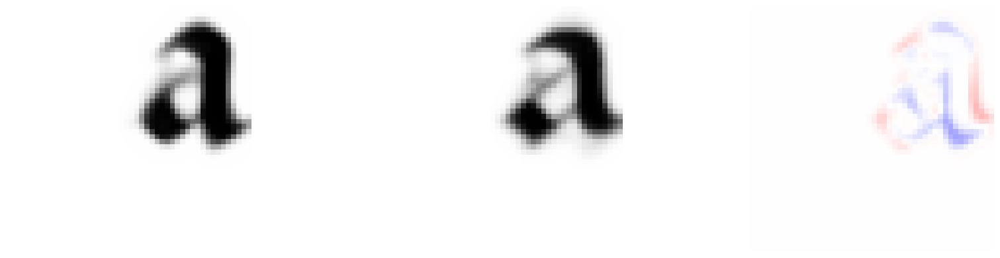

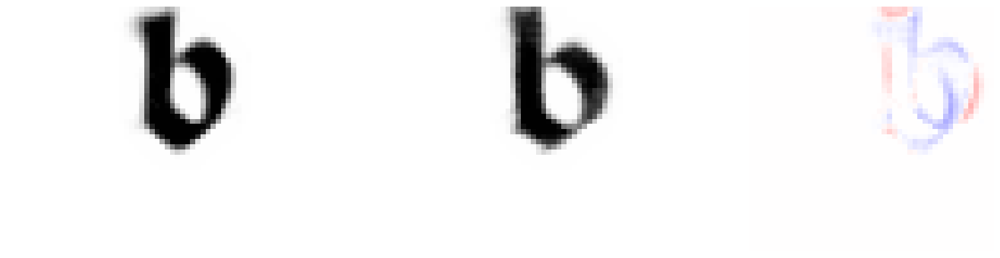

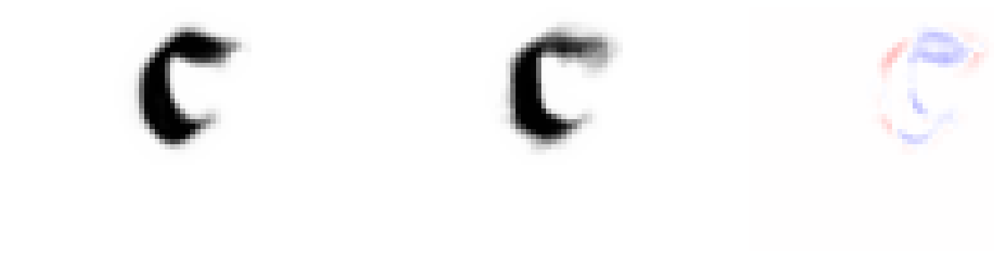

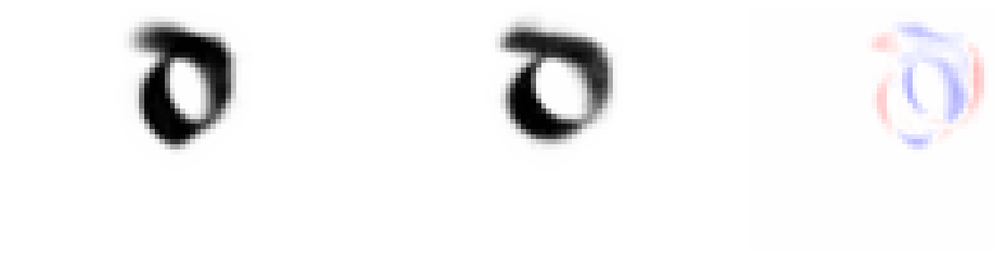

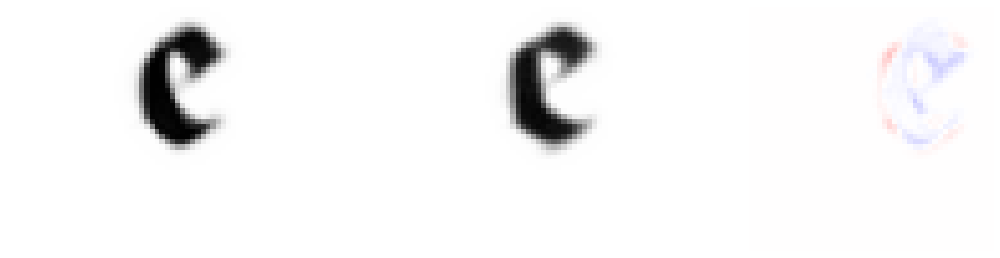

...

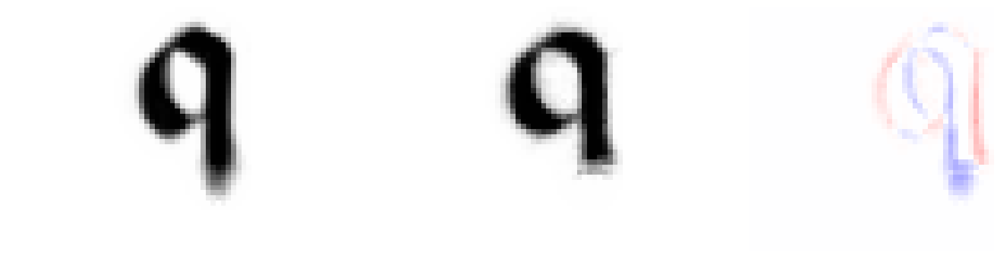

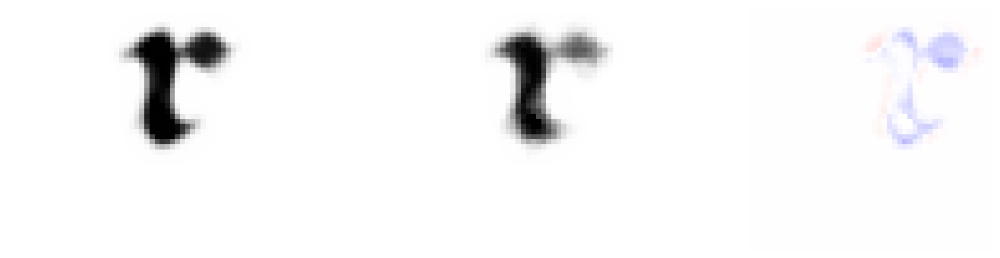

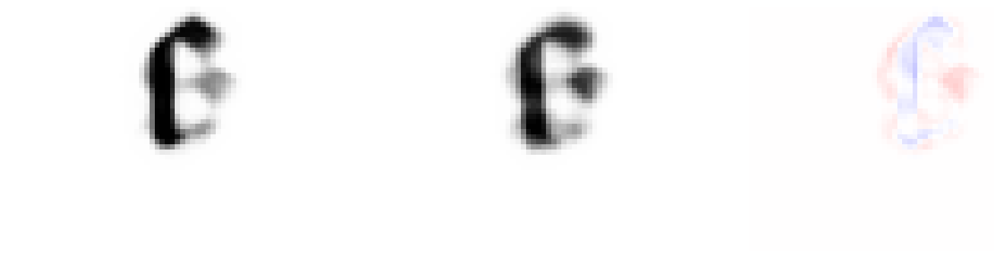

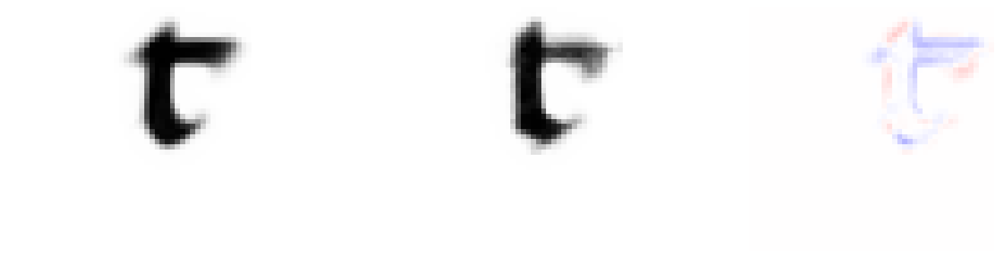

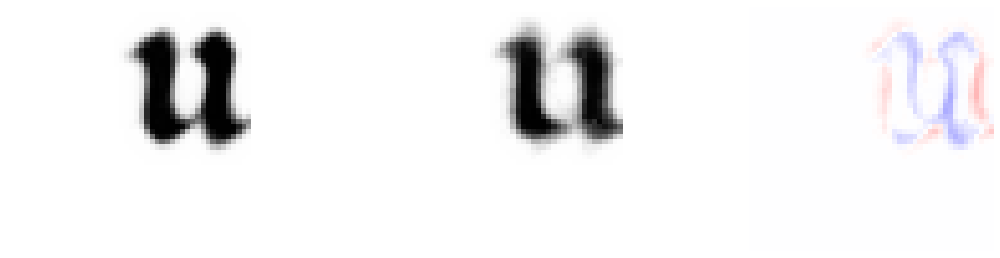

In [11]:
directory_path = 'paper_results/prototypes/filtered/'
directory = 'paper_results/comp_prototypes/'

for folder in folder_order:
    doc_path = os.path.join(directory_path, folder)
    print("Processing folder:", doc_path) 
    
    output_folder = os.path.join(directory, 'baseline_comp_all', folder)
    visualize_comparison(os.path.join(directory_path, 'baseline'), doc_path, character_range, output_folder)

### 2.2 Visualise the visual comparison

Created directory: paper_results/grids/
Processing folder: paper_results/comp_prototypes/baseline_comp_all/baseline
Processing folder: paper_results/comp_prototypes/baseline_comp_all/Northern_Textualis
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b8447298r
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b525068331
Processing folder: paper_results/comp_prototypes/baseline_comp_all/Arras-861
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b84473026
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b8455783p
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b55006072j
Processing folder: paper_results/comp_prototypes/baseline_comp_all/SBB-PK-Hdschr25
Processing folder: paper_results/comp_prototypes/baseline_comp_all/Southern_Textualis
Processing folder: paper_results/comp_prototypes/baseline_comp_all/btv1b90615126
Processing folder: paper_results/comp_prototypes/baseline_comp_a

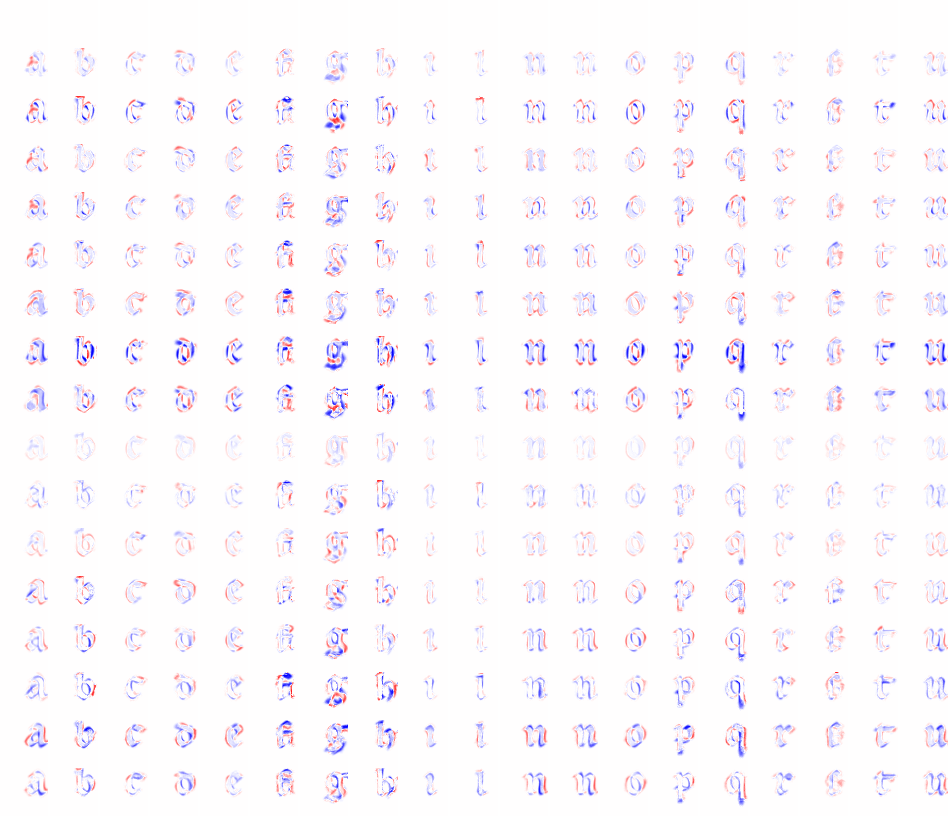

Image grid saved at: paper_results/grids/baseline_comp_all.jpeg


In [12]:
denoised_prototype_folders = "paper_results/comp_prototypes/baseline_comp_all/"
output_folder = "paper_results/grids/"
output_path = os.path.join(output_folder, "baseline_comp_all.jpeg")

os.makedirs(output_folder, exist_ok=True)
print(f"Created directory: {output_folder}")

sample_image_path = os.path.join(denoised_prototype_folders, folder_order[0], f"{character_range[0]}.png")
sample_image = PIL.Image.open(sample_image_path)

image_width, image_height = sample_image.size

denoised_prototypes_borders = folder_to_grid(denoised_prototype_folders, folder_order, character_range, image_width, image_height, margin=margin)

denoised_prototypes_borders.save(output_path)
print("Image grid saved at:", output_path)

### Calculate the variance of the two subtypes, Northern and Southern Textualis (cf. Section 4.1 in the paper)

In [13]:
directory_path = "paper_results/prototypes/filtered/"
nt_df = calculate_metric_for_directory(directory_path, "NT")
st_df = calculate_metric_for_directory(directory_path, "ST")

if nt_df is not None and st_df is not None:
    merged_df = merge_dataframes(st_df, nt_df)
    print(merged_df)
else:
    print("One or both DataFrames are empty.")

           Image    Std_ST    Std_NT
0   Image 28.png  3.409315  3.952366
1   Image 29.png  3.563122  4.106200
2   Image 30.png  2.441201  2.905906
3   Image 31.png  3.106441  3.788863
4   Image 32.png  2.313107  3.347374
5   Image 33.png  4.269359  4.326612
6   Image 34.png  5.443670  5.762127
7   Image 35.png  4.247564  4.869019
8   Image 36.png  1.620305  2.432967
9   Image 39.png  1.832525  2.481817
10  Image 40.png  3.105308  3.619836
11  Image 41.png  2.923636  3.660845
12  Image 42.png  2.687734  3.489355
13  Image 43.png  3.229233  4.152183
14  Image 44.png  3.933021  4.809044
15  Image 45.png  2.354015  2.785253
16  Image 46.png  2.369182  2.680951
17  Image 47.png  2.430756  3.043400
18  Image 48.png  3.003820  3.674446


## 3.0 Quantitative analysis 
### Document and Letter Graphs (cf. Section 3.1 in the paper)

### 3.1 Document graphs: 
Note: if you want to apply the same code to your data, you'll need an external .csv file with the calculated occurrences per document per letter like the one provided for our experiments

In [15]:
#For the style of the plots used in the article
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['figure.figsize'] = (15, 10)
matplotlib.rcParams['image.cmap'] = 'summer'
matplotlib.rcParams['font.size'] = 17
matplotlib.rcParams['legend.fontsize'] = 'large'
matplotlib.rcParams['figure.titlesize'] = 'medium'
matplotlib.rcParams['lines.linewidth'] = 2.0
plt.rcParams['text.usetex'] = False


folder_1 = [
    'paper_results/prototypes/filtered/Northern_Textualis/',  
    'paper_results/prototypes/filtered/Southern_Textualis/'
]

#uncomment for the entire corpus
folder_2 = [
    #NT
    #'paper_results/prototypes/filtered/btv1b8447298r/',
    #'paper_results/prototypes/filtered/btv1b525068331/',
    'paper_results/prototypes/filtered/Arras-861/',
    #'paper_results/prototypes/filtered/btv1b84473026/',
    'paper_results/prototypes/filtered/btv1b8455783p/',
    'paper_results/prototypes/filtered/btv1b55006072j/',
    #'paper_results/prototypes/filtered/SBB-PK-Hdschr25/',
    #ST
    #'paper_results/prototypes/filtered/btv1b90615126/', 
    'paper_results/prototypes/filtered/btv1b100361755/',    
    #'paper_results/prototypes/filtered/btv1b8433319z/',    
    #'paper_results/prototypes/filtered/IB15304245v/',
    #'paper_results/prototypes/filtered/btv1b90590259/',    
    'paper_results/prototypes/filtered/btv1b8446940n/', 
    'paper_results/prototypes/filtered/IB15304274v/', 
    
]

output_folder = 'paper_results/graphs/'

os.makedirs(output_folder, exist_ok=True)
print(f"Created directory: {output_folder}")

# Load JSON mapping of character index to label
json_path = 'runs/iwcp_south_north/transcribe.json'
with open(json_path) as json_file:
    character_mapping = json.load(json_file)
    

csv_path = 'char_occurrences.csv'


character_range = list(range(28, 36)) + list(range(39, 48))

char_occurrences_df = pd.read_csv(csv_path, index_col=0, sep=";")
char_occurrences_df = char_occurrences_df.loc[list(range(28,36)) + list(range(39, 48))]

char_occurrences_df = char_occurrences_df.apply(pd.to_numeric, errors='coerce')


def plot_document_graphs(folder_1_paths, folder_2_paths, output_folder, char_occurrences_df):
    num_rows = (len(folder_2_paths) + 2) // 3 
    fig, axs = plt.subplots(num_rows, 3, figsize=(22, 6 * num_rows)) 
    
    plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.3)  # Adjusted subplots layout

    max_occurrences = char_occurrences_df.max().max()
    min_occurrences = char_occurrences_df.min().min()

    all_max_l2_diff = []
    
    norm = LogNorm()
    for i, folder_2_path in enumerate(folder_2_paths):
        folder_comp_id = folder_2_path.split('/')[-2]
        codename = list(codename_to_id.keys())[list(codename_to_id.values()).index(folder_comp_id)]  # Get the corresponding Codename

        all_l2_diff_southern = []
        all_l2_diff_northern = []
                
        char_occurrences = char_occurrences_df[folder_comp_id]

        for character in character_range:
            northern_image_path = os.path.join(folder_1_paths[1], f'{character}.png')
            folder_2_image_path = os.path.join(folder_2_path, f'{character}.png')

            northern_image = Image.open(northern_image_path)
            folder_2_image = Image.open(folder_2_image_path)

            l2_difference_northern = calculate_l2_norm(northern_image, folder_2_image)
            all_l2_diff_northern.append(l2_difference_northern)

            southern_image_path = os.path.join(folder_1_paths[0], f'{character}.png')
            folder_2_image_path = os.path.join(folder_2_path, f'{character}.png')

            southern_image = Image.open(southern_image_path)
            folder_2_image = Image.open(folder_2_image_path)

            l2_difference_southern = calculate_l2_norm(southern_image, folder_2_image)
            all_l2_diff_southern.append(l2_difference_southern)

        # Plot the points with color intensity based on character occurrences             
        scatter = axs.flat[i].scatter(all_l2_diff_southern, all_l2_diff_northern, c=char_occurrences, cmap='viridis', norm=norm, alpha=0.6, s=60)
        axs.flat[i].set_ylabel(fr'Distance to ST prototype', fontsize=20)
        axs.flat[i].set_xlabel(fr'Distance to NT prototype', fontsize=20)
        axs.flat[i].grid(True)
        

        max_l2_difference = max(max(all_l2_diff_southern), max(all_l2_diff_northern))
        all_max_l2_diff.append(max_l2_difference)

        axs.flat[i].margins(0.3)

        for character, x, y in zip(character_range, all_l2_diff_southern, all_l2_diff_northern):
            axs.flat[i].text(x, y, character_mapping.get(str(character), str(character)), fontsize=20, ha='right', va='bottom')  # Adjust the font size of character text

        axs.flat[i].text(0.5, 0.98, fr'Document: {codename}', color='black', fontsize=20, ha='center', va='top', transform=axs.flat[i].transAxes)
    
    plt.tight_layout()

    for i, ax in enumerate(axs.flat):
        ax.plot([0, 17], [0, 17], linestyle='--', color='gray') 
        ax.set_xlim(0, 17)  
        ax.set_ylim(0, 17)
        ax.set_xticks([0, 5, 10, 15])  
        ax.set_yticks([0, 5, 10, 15])
        
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)  # Remove ticks and labels from both axes
        ax.grid(True)
        ax.set_xticklabels([]) 
        ax.set_yticklabels([]) 

    
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=norm), ax=axs, orientation='vertical',location='right', shrink=0.9)#, pad=0.1)
    cbar.set_label('Occurrences')
    

    output_plot_path = os.path.join(output_folder, 'paper_document_graphs.jpeg')
    plt.savefig(output_plot_path)
    plt.close()

plot_document_graphs(folder_1, folder_2, output_folder, char_occurrences_df)

Created directory: paper_results/graphs/


### 3.2 Letter graphs 

In [17]:
#These two will be the x,y axis prototypes
folder_1 = [
    'paper_results/prototypes/filtered/Northern_Textualis/',
    'paper_results/prototypes/filtered/Southern_Textualis/'
]

#The rest
folder_2 = [
    'paper_results/prototypes/filtered/btv1b8447298r/',
    'paper_results/prototypes/filtered/btv1b525068331/',
    'paper_results/prototypes/filtered/Arras-861/',
    'paper_results/prototypes/filtered/btv1b84473026/',
    'paper_results/prototypes/filtered/btv1b8455783p/',
    'paper_results/prototypes/filtered/btv1b55006072j/',
    'paper_results/prototypes/filtered/SBB-PK-Hdschr25/',
    'paper_results/prototypes/filtered/btv1b90615126/',
    'paper_results/prototypes/filtered/btv1b100361755/',
    'paper_results/prototypes/filtered/btv1b8433319z/',
    'paper_results/prototypes/filtered/IB15304245v/',
    'paper_results/prototypes/filtered/btv1b90590259/',
    'paper_results/prototypes/filtered/btv1b8446940n/',
    'paper_results/prototypes/filtered/IB15304274v/'
]

# Load JSON file with manuscript script information
script_path = 'datasets/iwcp_south_north/annotation.json'
manuscript_info_df = pd.read_json(script_path).T
manuscript_info_df['ID'] = manuscript_info_df.index.str.split('_').str[0]
manuscript_info_df = manuscript_info_df.drop_duplicates(subset=['ID'])


# Load JSON mapping of character index to label
json_path = 'runs/iwcp_south_north/transcribe.json'
with open(json_path) as json_file:
    character_mapping = json.load(json_file)

character_range = [28, 35, 36, 42, 43, 45]
#uncomment the following line for all of the letters
#character_range = list(range(28, 37)) + list(range(39, 49)) 

split_to_id = {
    'train': ['btv1b8447298r', 'btv1b525068331', 'Arras-861', 'btv1b84473026', 'btv1b90615126', 'btv1b100361755', 'btv1b8433319z', 'IB15304245v'],
    'test': ['btv1b8455783p', 'btv1b55006072j', 'SBB-PK-Hdschr25', 'btv1b90590259', 'btv1b8446940n', 'IB15304274v']
}


def plot_letter_graphs(folder_1_paths, folder_2_paths, output_folder, manuscript_info_df):
    num_rows = (len(character_range) + 2) // 3
    fig, axs = plt.subplots(num_rows, 3, figsize=(20, 6 * num_rows))

    all_max_l2_diff = []
    
    for i, character in enumerate(character_range):
        row = i // 3
        col = i % 3

        all_l2_diff_southern = []
        all_l2_diff_northern = []
        script_category = []  
        split_category = [] 
        
        for folder_2_path in folder_2_paths:
            northern_image_path = os.path.join(folder_1_paths[1], f'{character}.png') 
            folder_2_image_path = os.path.join(folder_2_path, f'{character}.png')

            northern_image = Image.open(northern_image_path)
            folder_2_image = Image.open(folder_2_image_path)

            l2_difference_northern = calculate_l2_norm(northern_image, folder_2_image)
            all_l2_diff_northern.append(l2_difference_northern)

            southern_image_path = os.path.join(folder_1_paths[0], f'{character}.png') 
            folder_2_image_path = os.path.join(folder_2_path, f'{character}.png')

            southern_image = Image.open(southern_image_path)
            folder_2_image = Image.open(folder_2_image_path)

            l2_difference_southern = calculate_l2_norm(southern_image, folder_2_image)
            all_l2_diff_southern.append(l2_difference_southern)

            # Determine script category for current folder
            folder_comp_id = os.path.basename(os.path.normpath(folder_2_path))
            codename = list(codename_to_id.keys())[list(codename_to_id.values()).index(folder_comp_id)]  # Get the corresponding Codename
            script = manuscript_info_df.loc[manuscript_info_df['ID'] == folder_comp_id, 'script']
            script_category.append(script.iloc[0] if not script.empty else 'Unknown')
            
            # Determine whether manuscript belongs to train or test split
            split = 'train' if folder_comp_id in split_to_id['train'] else 'test'
            split_category.append(split)


        # Plot the points with color intensity based on script category
        colors = []
        for script, split in zip(script_category, split_category):
            if script == 'Southern_Textualis':
                colors.append('red')
            else:
                colors.append('blue')

        # Plot the points with color intensity based on script category
        for southern, northern, color, split in zip(all_l2_diff_southern, all_l2_diff_northern, colors, split_category):
            marker_split = 'o' if split == 'train' else 'x'  # Use marker based on split category
            axs[row, col].scatter(southern, northern, c=color, marker=marker_split, s=65)
            axs[row, col].set_xlabel(fr'Distance to NT prototype', fontsize=20)
            axs[row, col].set_ylabel(fr'Distance to ST prototype', fontsize=20)
            axs[row, col].grid(True)

        max_l2_difference = max(max(all_l2_diff_southern), max(all_l2_diff_northern))
        
        plt.tight_layout()

        for j, (x, y) in enumerate(zip(all_l2_diff_southern, all_l2_diff_northern)):
            codename = list(codename_to_id.keys())[list(codename_to_id.values()).index(folder_2_paths[j].split('/')[-2])]  # Get the corresponding Codename
            axs[row, col].annotate(codename, (x, y), textcoords="offset points", xytext=(0, 0), ha='left', va='bottom', fontsize=15)

        all_max_l2_diff.append(max_l2_difference)
        
        all_l2_diff_southern = np.array(all_l2_diff_southern)
        all_l2_diff_northern = np.array(all_l2_diff_northern)
        
        character = character_mapping.get(str(character), str(character))
        axs[row, col].text(0.5, 0.98, fr'Character : {character}', color='black', fontsize=25, ha='center', va='top', transform=axs[row, col].transAxes)


    max_l2_difference_all = max(all_max_l2_diff)

    for i, ax in enumerate(axs.flat):
        ax.plot([0, 17], [0, 17], linestyle='--', color='gray') 
        ax.set_xlim(0, 17) 
        ax.set_ylim(0, 17)
        ax.set_xticks([0, 5, 10, 15]) 
        ax.set_yticks([0, 5, 10, 15])
        
    
        ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False)  # Remove ticks and labels from both axes
        ax.grid(True)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
    
    plt.tight_layout()
    
    output_folder = 'paper_results/graphs/'
    output_plot_path = os.path.join(output_folder, 'paper_letter_graphs.jpg')
    plt.savefig(output_plot_path)
    plt.close()

plot_letter_graphs(folder_1, folder_2, output_folder, manuscript_info_df)